<h1>Table of Contents<span class="tocSkip"></span></h1>
<div class="toc"><ul class="toc-item"><li><span><a href="#Age-of-air" data-toc-modified-id="Age-of-air-1"><span class="toc-item-num">1&nbsp;&nbsp;</span>Age of air</a></span></li><li><span><a href="#LWA-tendency-@-18-km" data-toc-modified-id="LWA-tendency-@-18-km-2"><span class="toc-item-num">2&nbsp;&nbsp;</span>LWA tendency @ 18 km</a></span></li><li><span><a href="#LWA-@-18-km" data-toc-modified-id="LWA-@-18-km-3"><span class="toc-item-num">3&nbsp;&nbsp;</span>LWA @ 18 km</a></span></li><li><span><a href="#Ozone" data-toc-modified-id="Ozone-4"><span class="toc-item-num">4&nbsp;&nbsp;</span>Ozone</a></span><ul class="toc-item"><li><span><a href="#@70-hPa" data-toc-modified-id="@70-hPa-4.1"><span class="toc-item-num">4.1&nbsp;&nbsp;</span>@70 hPa</a></span></li><li><span><a href="#@-200-hPa" data-toc-modified-id="@-200-hPa-4.2"><span class="toc-item-num">4.2&nbsp;&nbsp;</span>@ 200 hPa</a></span></li></ul></li><li><span><a href="#Potential-vorticity-@-70-hPa" data-toc-modified-id="Potential-vorticity-@-70-hPa-5"><span class="toc-item-num">5&nbsp;&nbsp;</span>Potential vorticity @ 70 hPa</a></span></li><li><span><a href="#Relative-vorticity" data-toc-modified-id="Relative-vorticity-6"><span class="toc-item-num">6&nbsp;&nbsp;</span>Relative vorticity</a></span><ul class="toc-item"><li><span><a href="#test-figures" data-toc-modified-id="test-figures-6.1"><span class="toc-item-num">6.1&nbsp;&nbsp;</span>test figures</a></span><ul class="toc-item"><li><span><a href="#@500hPa" data-toc-modified-id="@500hPa-6.1.1"><span class="toc-item-num">6.1.1&nbsp;&nbsp;</span>@500hPa</a></span></li><li><span><a href="#@250hPa" data-toc-modified-id="@250hPa-6.1.2"><span class="toc-item-num">6.1.2&nbsp;&nbsp;</span>@250hPa</a></span></li></ul></li><li><span><a href="#Final-figure" data-toc-modified-id="Final-figure-6.2"><span class="toc-item-num">6.2&nbsp;&nbsp;</span>Final figure</a></span></li></ul></li><li><span><a href="#TAU" data-toc-modified-id="TAU-7"><span class="toc-item-num">7&nbsp;&nbsp;</span>TAU</a></span></li><li><span><a href="#Zonal-wind" data-toc-modified-id="Zonal-wind-8"><span class="toc-item-num">8&nbsp;&nbsp;</span>Zonal wind</a></span></li><li><span><a href="#Temperature" data-toc-modified-id="Temperature-9"><span class="toc-item-num">9&nbsp;&nbsp;</span>Temperature</a></span></li><li><span><a href="#OGWD" data-toc-modified-id="OGWD-10"><span class="toc-item-num">10&nbsp;&nbsp;</span>OGWD</a></span></li><li><span><a href="#OGWD-rotation" data-toc-modified-id="OGWD-rotation-11"><span class="toc-item-num">11&nbsp;&nbsp;</span>OGWD rotation</a></span></li><li><span><a href="#Meridional-wind-(ZM-removed)" data-toc-modified-id="Meridional-wind-(ZM-removed)-12"><span class="toc-item-num">12&nbsp;&nbsp;</span>Meridional wind (ZM removed)</a></span></li><li><span><a href="#-d-OGWD_x-/-dy" data-toc-modified-id="-d-OGWD_x-/-dy-13"><span class="toc-item-num">13&nbsp;&nbsp;</span>-d OGWD_x / dy</a></span></li><li><span><a href="#Eddy-streamfunction" data-toc-modified-id="Eddy-streamfunction-14"><span class="toc-item-num">14&nbsp;&nbsp;</span>Eddy streamfunction</a></span></li><li><span><a href="#Divergence-of-OGWD" data-toc-modified-id="Divergence-of-OGWD-15"><span class="toc-item-num">15&nbsp;&nbsp;</span>Divergence of OGWD</a></span></li><li><span><a href="#Vertical-derivation-of-potential-temperature" data-toc-modified-id="Vertical-derivation-of-potential-temperature-16"><span class="toc-item-num">16&nbsp;&nbsp;</span>Vertical derivation of potential temperature</a></span></li><li><span><a href="#tendency-of-relative-vorticity" data-toc-modified-id="tendency-of-relative-vorticity-17"><span class="toc-item-num">17&nbsp;&nbsp;</span>tendency of relative vorticity</a></span></li><li><span><a href="#tendency-of-pot.-vorticity" data-toc-modified-id="tendency-of-pot.-vorticity-18"><span class="toc-item-num">18&nbsp;&nbsp;</span>tendency of pot. vorticity</a></span></li><li><span><a href="#tendency-of-vertical-derivation-of-potential-temperature" data-toc-modified-id="tendency-of-vertical-derivation-of-potential-temperature-19"><span class="toc-item-num">19&nbsp;&nbsp;</span>tendency of vertical derivation of potential temperature</a></span></li><li><span><a href="#CEQ" data-toc-modified-id="CEQ-20"><span class="toc-item-num">20&nbsp;&nbsp;</span>CEQ</a></span></li></ul></div>

In [1]:
import xarray as xr
import sys
import random
from scipy import stats
import glob
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
import shapely.geometry as sgeom
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import numpy as np
import matplotlib

%matplotlib inline

In [2]:
func = lambda x: x.split('comp_')[1].split('_{}days'.format(time_scale))[0]


In [8]:
its = 10000
DJF_bool = 'DJF'                                                          
DJF_bool = '_{}only'.format(DJF_bool) 
cesta_root = '/mnt/4data/CMAM/0A.daily/'
cesta_root = '/mnt/data04/model/CMAM/0A.daily/'
cesta = f'{cesta_root}composites_woSSW{DJF_bool}/'
print(cesta)
time_scale = '20'
lw = 2
comp_name_ls = ['himalayas', 'eastasia', 'westamer',]
size_dict = {'20': [45,74,36], '30': [38,66,35]}
line_width = 5
box = sgeom.box(minx=70, maxx=105, miny=20, maxy=42)
box2 = sgeom.box(minx=110, maxx=145, miny=30, maxy=48)
box3 = sgeom.box(minx=-125, maxx=-102.5, miny=27.5, maxy=52)
boxes = [box, box2, box3]
projection = ccrs.PlateCarree(central_longitude=0)#Robinson()# Orthographic(180, 90)
proj_str = str(projection).split('crs.')[1].split(' object')[0]

/mnt/data04/model/CMAM/0A.daily/composites_woSSW_DJFonly/


# Age of air

In [10]:
comp_file_ls

['/mnt/data04/model/CMAM/0A.daily/composites_woSSW_DJFonly/stmeanage_anomalies_comp_westamer_20days.nc',
 '/mnt/data04/model/CMAM/0A.daily/composites_woSSW_DJFonly/stmeanage_anomalies_comp_eastasia_20days.nc',
 '/mnt/data04/model/CMAM/0A.daily/composites_woSSW_DJFonly/stmeanage_anomalies_comp_himalayas_20days.nc']

In [12]:
var = 'stmeanage'
ch_lev = 7000
what = 'anomalies'
if var[:3].lower() in ['lwa']:
    lev_sys_fo = 'log_coord/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'
else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'
    
comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(
    comp_file_ls, 
    concat_dim='e_type',
    combine='nested'
)
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)
ds_comp[var] = ds_comp[var]#*24*3600
ds_comp[var].attrs['units'] = 'years'
ds_comp[var].attrs['long_name'] = r'AoA'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file)[var].sel(**sel_dict).mean('month')


outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}{}.nc'.format(cesta, var, lev_sys_fi, \
                                                                    its, time_scale, \
                                                                    ch_lev, units)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(
    outfile_name_ls, 
    concat_dim='e_type',
    combine='nested'
)
ds_pv['e_type'] = list(map(func, outfile_name_ls))


/mnt/data04/model/CMAM/0A.daily//stmeanage/stmeanage_climatology_woSSW.nc
/mnt/data04/model/CMAM/0A.daily/composites_woSSW_DJFonly/stmeanage_pvalues_from10000_comp_*_20days@7000Pa.nc


In [32]:
ds_pv

<xarray.Dataset>
Dimensions:    (e_type: 3, lat: 48, lon: 96)
Coordinates:
    plev       float64 7e+03
  * lat        (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon        (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
    lag        int64 0
  * e_type     (e_type) <U9 'westamer' 'himalayas' 'eastasia'
Data variables:
    stmeanage  (e_type, lat, lon) float64 dask.array<shape=(3, 48, 96), chunksize=(1, 48, 96)>

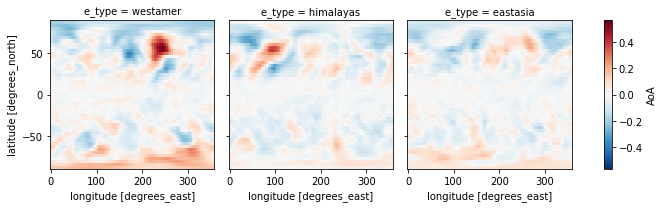

In [9]:
ds_comp[var].plot(col = 'e_type')

In [29]:
ds_comp2.min()

<xarray.DataArray 'stmeanage' ()>
array(0.347411)
Coordinates:
    plev     float64 7e+03

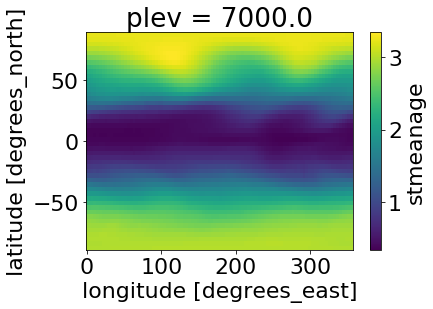

In [22]:
ds_comp2.plot()

In [15]:
[comp_name_ls[0]]

'himalayas'

stmeanage@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


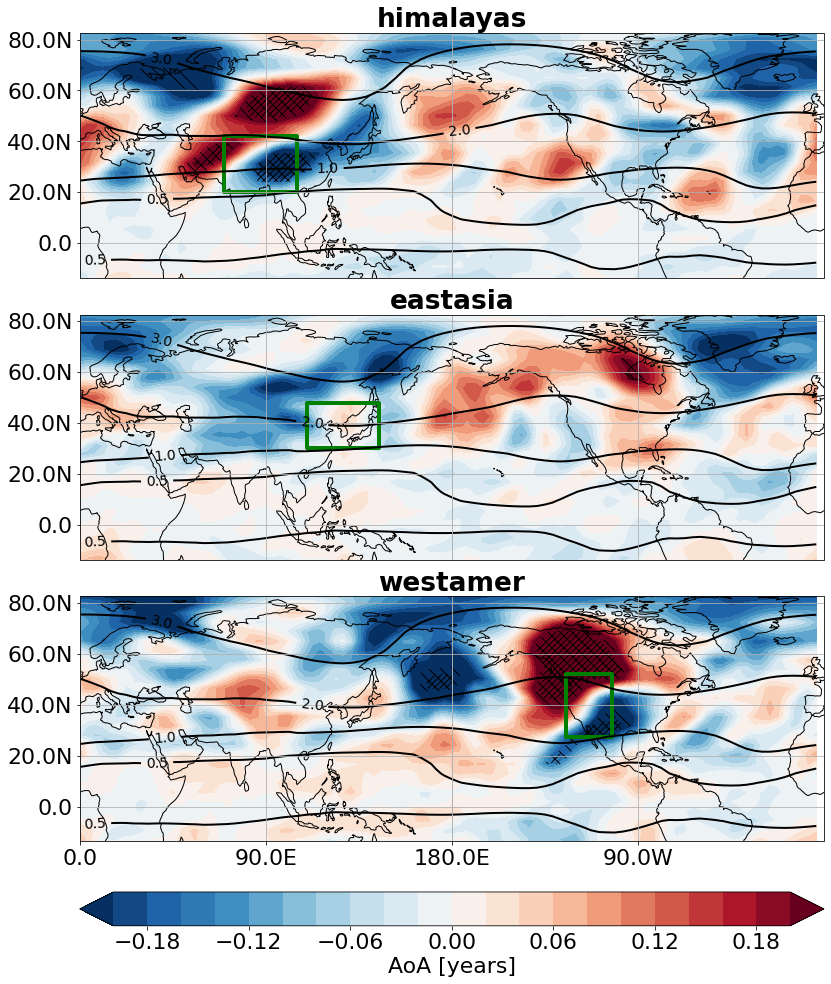

In [13]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = ds_comp[var].sel(e_type = comp_name_ls).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})


for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    CS = (ds_comp2).plot.contour(ax = ax, levels = [0.5,1,2,3], robust = True, \
                                         linewidths = lw, colors = 'k', \
                                         transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)
    
   

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
#plt.savefig(out_fig, bbox_inches='tight')

stmeanage@7000Pa_anomalies_allwclim_20days_PlateCarree_DJFonly+HIonly.pdf


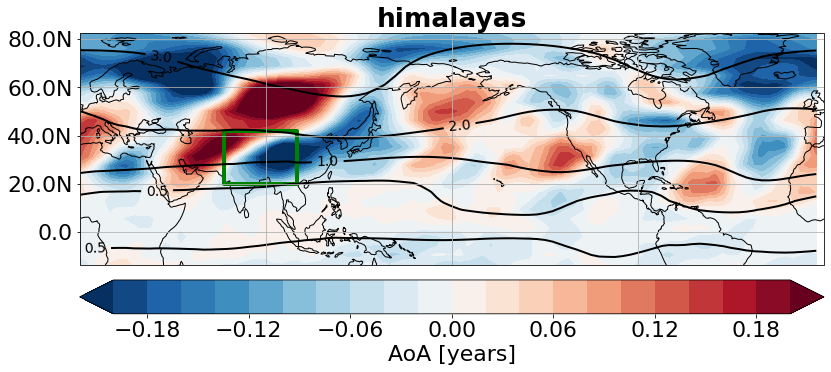

In [20]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = ds_comp[var].sel(e_type = [comp_name_ls[0]]).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})


for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    CS = (ds_comp2).plot.contour(ax = ax, levels = [0.5,1,2,3], robust = True, \
                                         linewidths = lw, colors = 'k', \
                                         transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)
    
   

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    #temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    #temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}+HIonly.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
out_fig = '{}@{}{}_{}_allwclim_{}days_{}{}+HIonly.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# LWA tendency @ 18 km

In [4]:
var = 'lwatend'
ch_lev = 18000
what = 'anomalies'
if var[:3].lower() in ['lwa']:
    lev_sys_fo = 'log_coord/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'
else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'
    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}{}.nc'.format(cesta, var, lev_sys_fi, \
                                                                    its, time_scale, \
                                                                    ch_lev, units)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)
ds_comp[var] = ds_comp[var]*24*3600
ds_comp[var].attrs['units'] = 'm/s/day'
ds_comp[var].attrs['long_name'] = r'LWA$_{t}$'


comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataarray(comp_file).sel(**sel_dict).mean('month')
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/lwatend_logH_pvalues_from10000_comp_*_20days@18000m.nc
/mnt/4data/CMAM/0A.daily//lwatend/log_coord/lwatend_climatology_woSSW.nc


<xarray.DataArray 'lwatend' (lat: 48, lon: 96)>
array([[-1.094247e-08, -2.521705e-08, -4.196295e-08, ..., -2.472215e-08,
        -2.628728e-08, -1.797020e-08],
       [-2.019740e-08, -3.565495e-08, -1.070849e-07, ..., -9.183413e-08,
        -6.224086e-08, -4.345726e-08],
       [ 1.135852e-08,  1.161393e-08, -6.433736e-08, ..., -1.499312e-07,
        -8.019192e-08, -4.048929e-08],
       ...,
       [ 1.550278e-07,  1.777329e-07,  1.403019e-07, ...,  6.687326e-08,
         1.080825e-07,  1.384305e-07],
       [ 5.479238e-08,  6.908623e-08,  6.642595e-08, ...,  1.475698e-08,
         3.217795e-08,  4.366622e-08],
       [ 0.000000e+00,  0.000000e+00,  0.000000e+00, ...,  0.000000e+00,
         0.000000e+00,  0.000000e+00]])
Coordinates:
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
    z        float64 1.8e+04

/usr/local/lib/python3.6/dist-packages/matplotlib/__init__.py:855: MatplotlibDeprecationWarning: 
examples.directory is deprecated; in the future, examples will be found relative to the 'datapath' directory.
  "found relative to the 'datapath' directory.".format(key))
/usr/local/lib/python3.6/dist-packages/matplotlib/__init__.py:846: MatplotlibDeprecationWarning: 
The text.latex.unicode rcparam was deprecated in Matplotlib 2.2 and will be removed in 3.1.
  "2.2", name=key, obj_type="rcparam", addendum=addendum)
/usr/local/lib/python3.6/dist-packages/seaborn/apionly.py:9: UserWarning: As seaborn no longer sets a default style on import, the seaborn.apionly module is deprecated. It will be removed in a future version.
  warnings.warn(msg, UserWarning)


lwatend@18000m_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


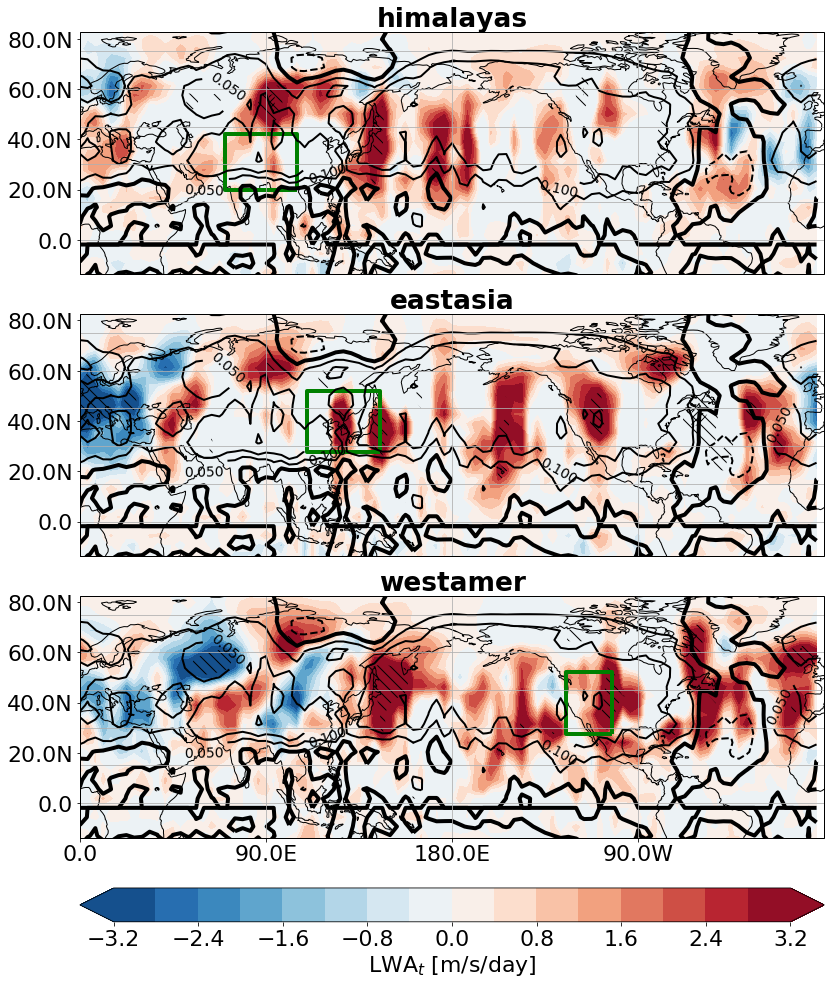

In [5]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = ds_comp[var].sel(e_type = comp_name_ls).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})


for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    CS = (ds_comp2*24*3600).plot.contour(ax = ax, levels = [-0.2,-0.1,-0.05, 0.05, 0.1,0.2], robust = True, \
                                         linewidths = lw, colors = 'k', \
                                         transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)
    
    CS = (ds_comp2*24*3600).plot.contour(ax = ax, levels = [0], robust = True, \
                                         linewidths = lw+2, colors = 'k', \
                                         transform=ccrs.PlateCarree())

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# LWA @ 18 km

In [6]:
var = 'lwa'
ch_lev = 18000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'log_coord/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'
else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'
    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}{}.nc'.format(cesta, var, lev_sys_fi, \
                                                                                                            its, time_scale, \
                                                                                                            ch_lev, units)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)
ds_comp[var].attrs['units'] = 'm/s'
ds_comp[var].attrs['long_name'] = 'LWA'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataarray(comp_file).sel(**sel_dict).mean('month')
ds_comp2

/mnt/4data/CMAM/0A.daily//lwa/log_coord/lwa_climatology_woSSW.nc


<xarray.DataArray 'lwa' (lat: 48, lon: 96)>
array([[1.057081, 1.055132, 1.05374 , ..., 1.0618  , 1.061472, 1.05908 ],
       [3.142497, 3.133463, 3.120705, ..., 3.183365, 3.175278, 3.156295],
       [6.008845, 5.982477, 5.955137, ..., 6.104574, 6.08145 , 6.039313],
       ...,
       [1.305316, 1.303439, 1.318948, ..., 1.343385, 1.330427, 1.316407],
       [0.476116, 0.476427, 0.482525, ..., 0.492103, 0.485804, 0.47949 ],
       [0.      , 0.      , 0.      , ..., 0.      , 0.      , 0.      ]])
Coordinates:
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
    z        float64 1.8e+04

lwa@18000m_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


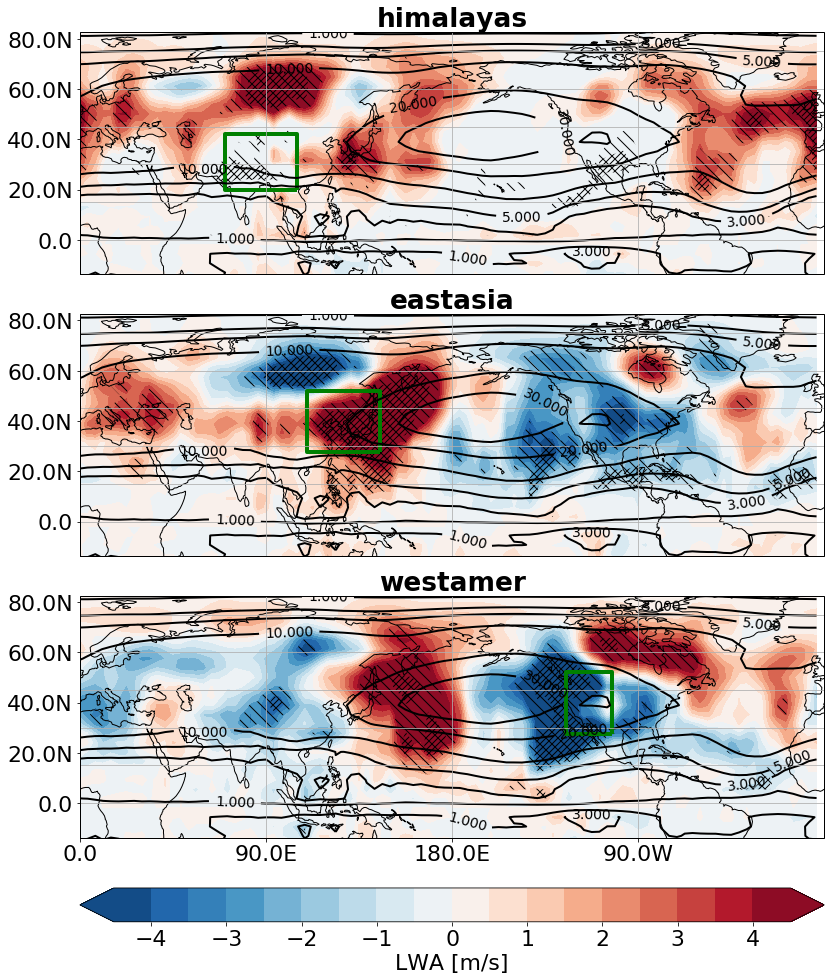

In [7]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = ds_comp[var].sel(e_type = comp_name_ls).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})


for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    CS = (ds_comp2).plot.contour(ax = ax, levels = [1,3,5,10,20,30,50,100], linewidths = lw, \
                                               colors = 'k', transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# Ozone

## @70 hPa

In [15]:
var = 'vmro3'
ch_lev = 7000
what = 'percentages'
if var.lower() in ['lwa']:
    lev_sys_fo = 'log_coord/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)
ds_comp[var].attrs['units'] = '%'
#ds_comp.lat.attrs['units'] = 'degrees'
#ds_comp.lon.attrs['units'] = 'degrees'
ds_comp[var].attrs['long_name'] = r'O$_{3}$ VMR'


comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/vmro3_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//vmro3/vmro3_climatology_woSSW.nc


<xarray.DataArray 'vmro3' (lat: 48, lon: 96)>
array([[2.093237e-06, 2.093991e-06, 2.094731e-06, ..., 2.090998e-06,
        2.091732e-06, 2.092481e-06],
       [2.074869e-06, 2.076555e-06, 2.078243e-06, ..., 2.071068e-06,
        2.072020e-06, 2.073318e-06],
       [2.062657e-06, 2.066177e-06, 2.069465e-06, ..., 2.056111e-06,
        2.057217e-06, 2.059502e-06],
       ...,
       [2.490606e-06, 2.488687e-06, 2.487839e-06, ..., 2.503041e-06,
        2.498038e-06, 2.493757e-06],
       [2.530102e-06, 2.528801e-06, 2.528082e-06, ..., 2.537345e-06,
        2.534431e-06, 2.531991e-06],
       [2.561831e-06, 2.561172e-06, 2.560679e-06, ..., 2.564787e-06,
        2.563643e-06, 2.562655e-06]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

vmro3@7000Pa_percentages_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


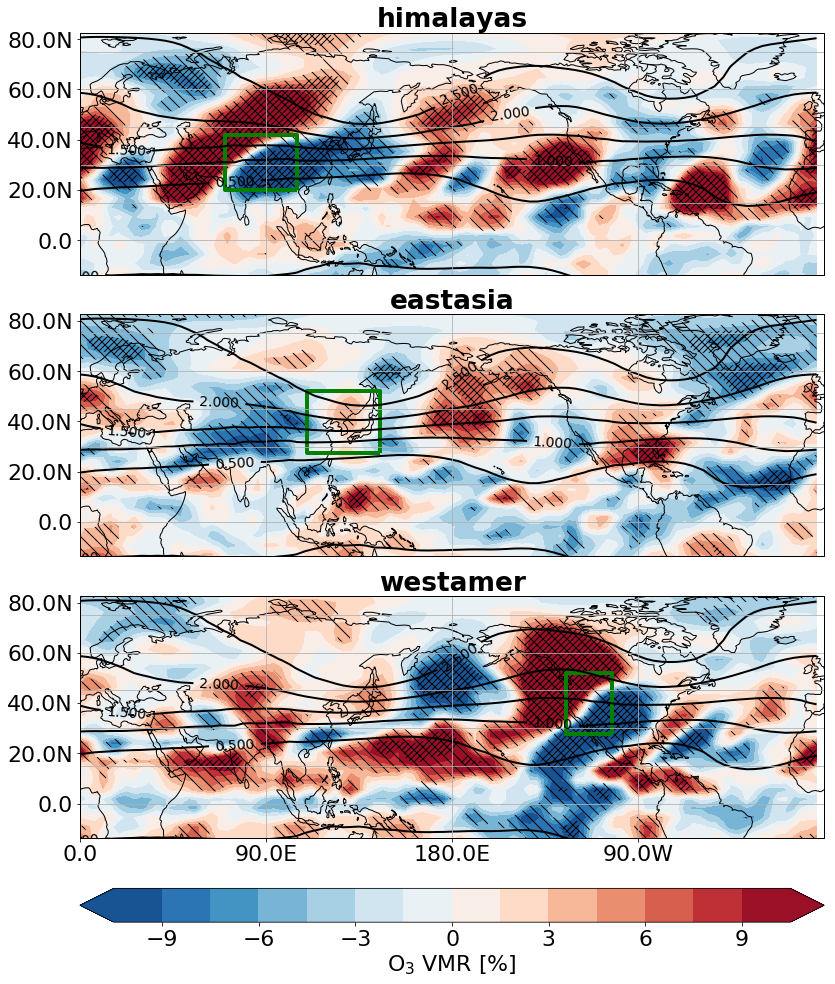

In [16]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = ds_comp[var].sel(e_type = comp_name_ls).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    CS = (ds_comp2*1e6).plot.contour(ax = ax, linewidths = lw, \
                                               colors = 'k', transform=ccrs.PlateCarree(), locator=plt.LogLocator())
    #levels = [1e-7,2e-7,3e-7,4e-7,5e-7,8e-7,10e-7],
    
    plt.clabel(CS, inline=1, fontsize=14)#, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

## @ 200 hPa

In [8]:
var = 'vmro3'
ch_lev = 20000
what = 'percentages'
if var.lower() in ['lwa']:
    lev_sys_fo = 'log_coord/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)
ds_comp[var].attrs['units'] = '%'
#ds_comp.lat.attrs['units'] = 'degrees'
#ds_comp.lon.attrs['units'] = 'degrees'
ds_comp[var].attrs['long_name'] = r'O$_{3}$ VMR'


comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/vmro3_pvalues_from10000_comp_*_20days@20000Pa.nc
/mnt/4data/CMAM/0A.daily//vmro3/vmro3_climatology_woSSW.nc


<xarray.DataArray 'vmro3' (lat: 48, lon: 96)>
array([[4.500475e-07, 4.504267e-07, 4.508399e-07, ..., 4.491364e-07,
        4.494012e-07, 4.497051e-07],
       [4.377599e-07, 4.380065e-07, 4.383894e-07, ..., 4.382531e-07,
        4.378509e-07, 4.376952e-07],
       [4.343587e-07, 4.352765e-07, 4.362234e-07, ..., 4.343272e-07,
        4.336801e-07, 4.337456e-07],
       ...,
       [4.378101e-07, 4.382914e-07, 4.390130e-07, ..., 4.393149e-07,
        4.382996e-07, 4.377776e-07],
       [4.453384e-07, 4.454083e-07, 4.457477e-07, ..., 4.471432e-07,
        4.461935e-07, 4.455911e-07],
       [4.550757e-07, 4.549028e-07, 4.548254e-07, ..., 4.562028e-07,
        4.557246e-07, 4.553488e-07]])
Coordinates:
    plev     float64 2e+04
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

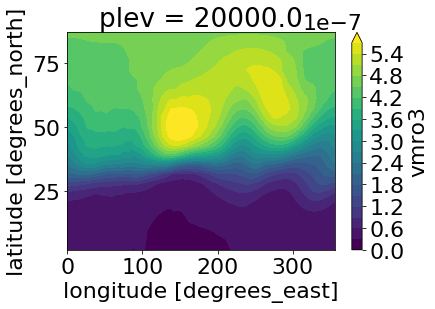

In [9]:
ds_comp2.sel(lat= slice(0,None)).plot.contourf(robust = True, levels = 21)

vmro3@20000Pa_percentages_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


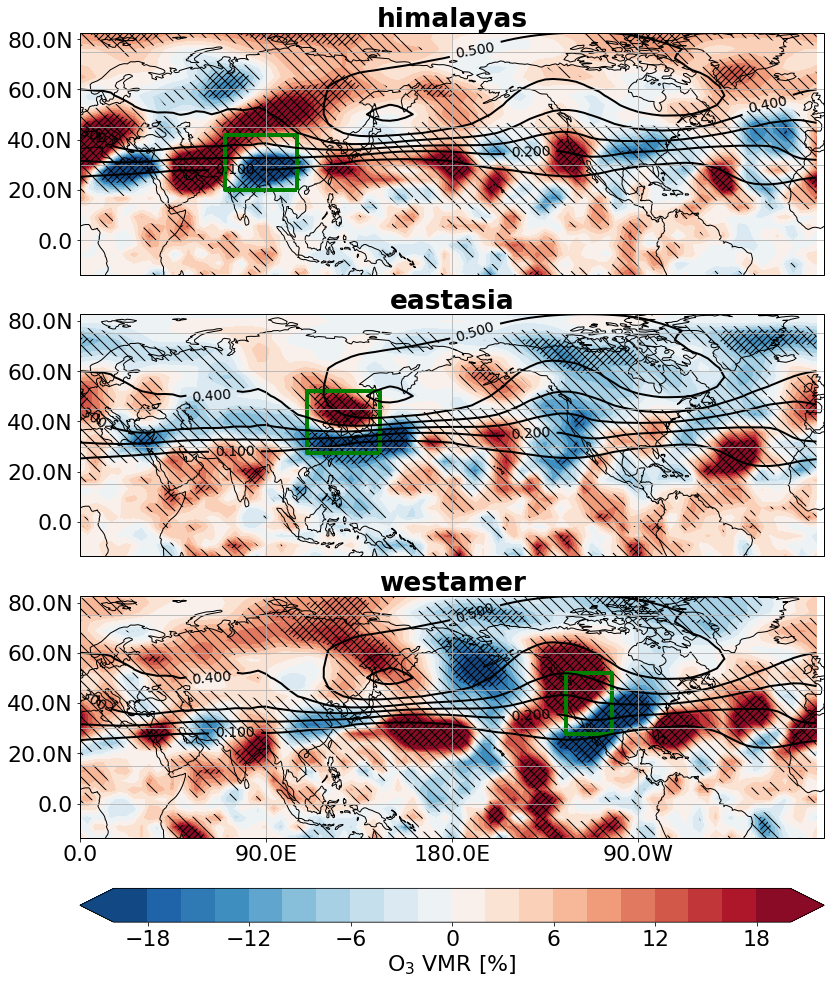

In [10]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = ds_comp[var].sel(e_type = comp_name_ls).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    CS = (ds_comp2*1e6).plot.contour(ax = ax, linewidths = lw, \
                                               colors = 'k', transform=ccrs.PlateCarree(), locator=plt.LogLocator())
    #levels = [1e-7,2e-7,3e-7,4e-7,5e-7,8e-7,10e-7],
    
    plt.clabel(CS, inline=1, fontsize=14)#, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# Potential vorticity @ 70 hPa

In [11]:
var = 'vorpot'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e6
ds_comp[var].attrs['units'] = 'PVU'#'$10^{-6}$ K m$^2$/kg/s'
ds_comp[var].attrs['long_name'] = r'PV'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/vorpot_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//vorpot/vorpot_climatology_woSSW.nc


<xarray.DataArray 'vorpot' (lat: 48, lon: 96)>
array([[-3.224643e-05, -3.224826e-05, -3.225049e-05, ..., -3.224279e-05,
        -3.224371e-05, -3.224492e-05],
       [-3.209420e-05, -3.209988e-05, -3.210681e-05, ..., -3.208433e-05,
        -3.208658e-05, -3.208980e-05],
       [-3.194634e-05, -3.194679e-05, -3.195241e-05, ..., -3.196810e-05,
        -3.195907e-05, -3.195094e-05],
       ...,
       [ 2.352786e-05,  2.350272e-05,  2.349096e-05, ...,  2.368568e-05,
         2.362056e-05,  2.356730e-05],
       [ 2.408464e-05,  2.406258e-05,  2.404687e-05, ...,  2.418617e-05,
         2.414686e-05,  2.411285e-05],
       [ 2.456858e-05,  2.455825e-05,  2.454993e-05, ...,  2.461219e-05,
         2.459552e-05,  2.458099e-05]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

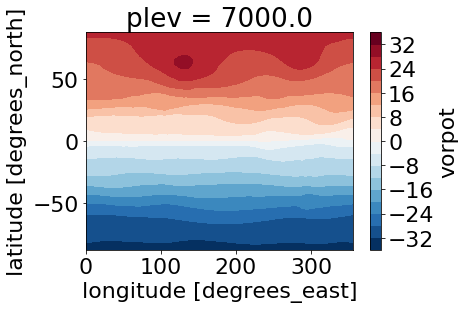

In [12]:
(ds_comp2*1e6).plot.contourf(robust = True, levels = 21)

vorpot@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


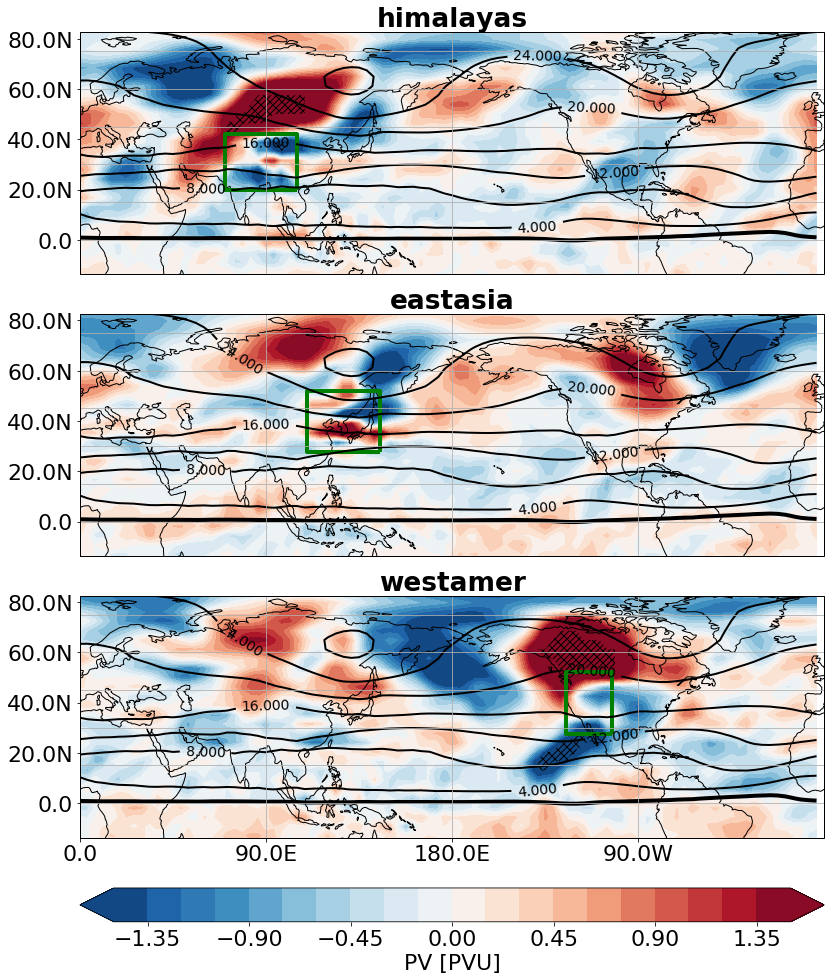

In [13]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    CS = (ds_comp2*1e6).plot.contour(levels = [4, 8, 12, 16, 20, 24, 28, 32], colors = 'k', \
                                                ax = ax, linewidths = lw, \
                                                transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# Relative vorticity

In [106]:
var = 'vorrel'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e6
ds_comp[var].attrs['units'] = '$10^{-6} s^{-1}$'
ds_comp[var].attrs['long_name'] = r'$\xi$'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/vorrel_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//vorrel/vorrel_climatology_woSSW.nc


<xarray.DataArray 'vorrel' (lat: 48, lon: 96)>
array([[-1.492275e-06, -1.510238e-06, -1.529519e-06, ..., -1.447714e-06,
        -1.460807e-06, -1.475739e-06],
       [-1.424592e-06, -1.457124e-06, -1.484994e-06, ..., -1.285281e-06,
        -1.339054e-06, -1.385550e-06],
       [-1.902832e-06, -1.904410e-06, -1.897306e-06, ..., -1.795906e-06,
        -1.851321e-06, -1.886532e-06],
       ...,
       [ 1.678247e-05,  1.671502e-05,  1.670689e-05, ...,  1.720803e-05,
         1.704542e-05,  1.689806e-05],
       [ 1.774436e-05,  1.768656e-05,  1.764826e-05, ...,  1.800795e-05,
         1.790838e-05,  1.781936e-05],
       [ 1.800444e-05,  1.796117e-05,  1.792073e-05, ...,  1.814901e-05,
         1.809865e-05,  1.805035e-05]], dtype=float32)
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

## test figures

### @500hPa

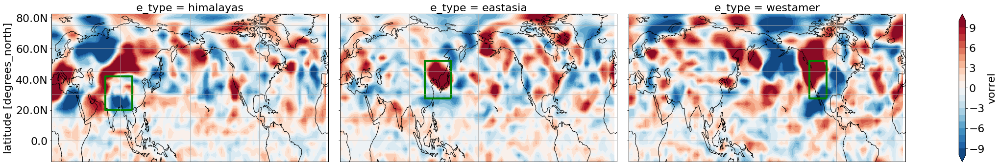

In [130]:
test_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
test_comp['e_type'] = list(map(func, comp_file_ls))
p = (test_comp.sel(plev = 50000, \
                   lag = 0, \
                   e_type = comp_name_ls)*1e6)[var].plot.contourf(col = 'e_type', levels = 21, \
                                                             robust = True,\
                                                        aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, transform=ccrs.PlateCarree(), \
                                                        subplot_kws={'projection': projection})
for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
    ax.set_aspect('auto')
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])


### @250hPa

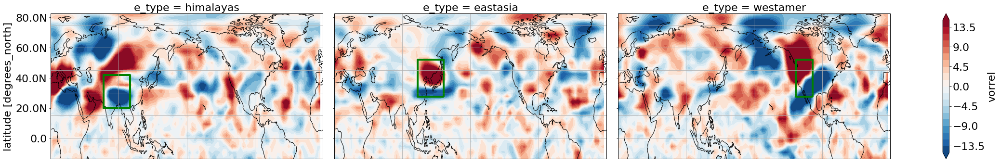

In [131]:
test_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
test_comp['e_type'] = list(map(func, comp_file_ls))
p = (test_comp.sel(plev = 25000, \
                   lag = 0, \
                   e_type = comp_name_ls)*1e6)[var].plot.contourf(col = 'e_type', levels = 21, \
                                                             robust = True,\
                                                        aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, transform=ccrs.PlateCarree(), \
                                                        subplot_kws={'projection': projection})
for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
    ax.set_aspect('auto')
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])


In [ ]:
test_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
test_comp['e_type'] = list(map(func, comp_file_ls))
p = (test_comp.sel(plev = 25000, \
                   lag = 0, \
                   e_type = comp_name_ls)*1e6)[var].plot.contourf(col = 'e_type', levels = 21, \
                                                             robust = True,\
                                                        aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, transform=ccrs.PlateCarree(), \
                                                        subplot_kws={'projection': projection})
for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)
    ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
    ax.set_aspect('auto')
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])


## Final figure

vorrel@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


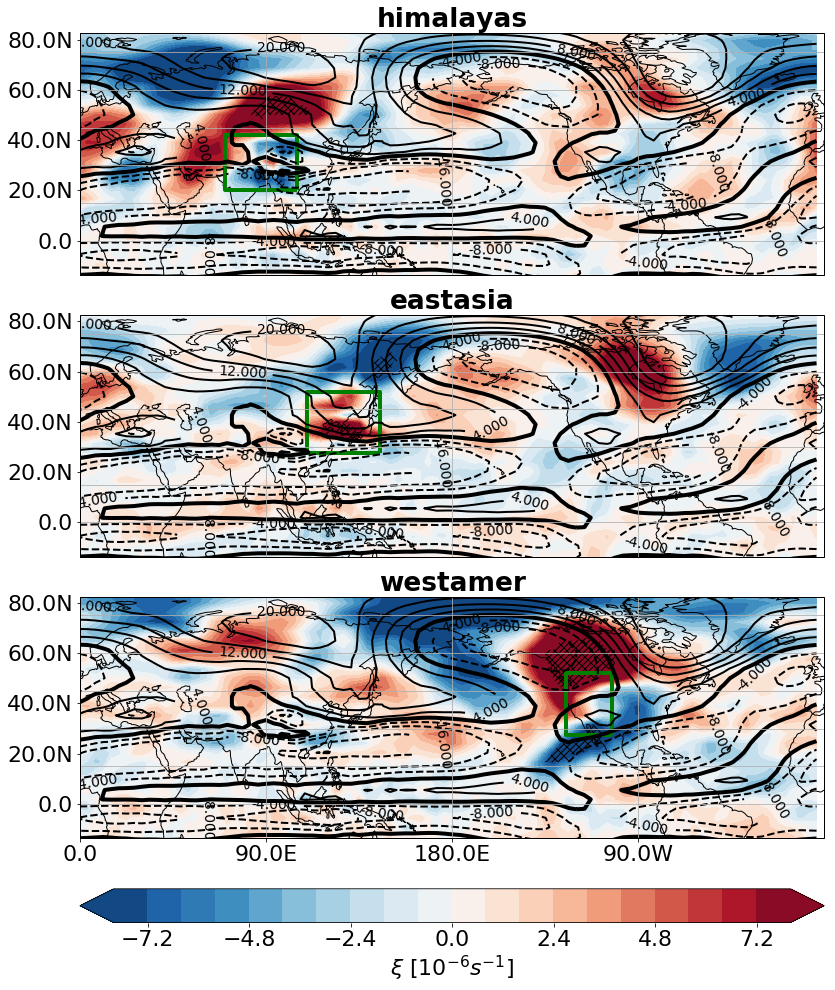

In [16]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    CS = (ds_comp2*1e6).plot.contour(levels = [-20,-16,-8, -4, 4, 8, 12, 16, 20], \
                                     colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# TAU

In [30]:
var = 'tauv'
what = 'anomalies'
if var == 'tauu':
    long_name = r'Surface Downward Eastward Wind Stress'
elif var == 'tauv':
    long_name = r'Surface Downward Northward Wind Stress'

lev_sys_fo = ''
lev_sys_fi = ''
units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, its, time_scale,)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type', combine = 'nested')#, parallel = True)
ds_pv['e_type'] = list(map(func, outfile_name_ls))
ds_pv = ds_pv.sel(lag = 0)

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type', combine = 'nested')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(lag = 0)
ds_comp[var].attrs['units'] = units
ds_comp[var].attrs['long_name'] = long_name

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict = dict(month = [12, 1, 2])
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/tauv_pvalues_from10000_comp_*_20days.nc
/mnt/4data/CMAM/0A.daily//tauv/tauv_climatology_woSSW.nc


<xarray.DataArray 'tauv' (lat: 48, lon: 96)>
array([[-1.77140441e-03, -2.52017914e-03, -1.82381005e-03, ...,
        -3.88326705e-03, -1.38532091e-03, -1.15378958e-03],
       [-7.83021748e-03, -5.50757488e-03, -3.21711972e-03, ...,
        -2.98627932e-03, -1.27457350e-03, -9.78774042e-04],
       [-1.08849257e-02, -1.07370345e-02, -6.78155397e-04, ...,
        -1.83891936e-03, -4.45473124e-04, -3.06545640e-03],
       ...,
       [-7.87833142e-06, -3.99386736e-05, -9.24557913e-04, ...,
        -8.19870969e-04, -9.35405042e-05, -1.86468515e-05],
       [-1.83300165e-06, -1.75689968e-06, -1.40501015e-06, ...,
        -1.47628496e-04, -3.74755655e-05, -1.32848245e-05],
       [-3.21029893e-06, -2.97544352e-06, -2.75666275e-06, ...,
        -4.09400081e-06, -3.53217797e-06, -3.30897274e-06]], dtype=float32)
Coordinates:
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

{'e_type': 'himalayas'}
{'e_type': 'eastasia'}
{'e_type': 'westamer'}
tauv_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


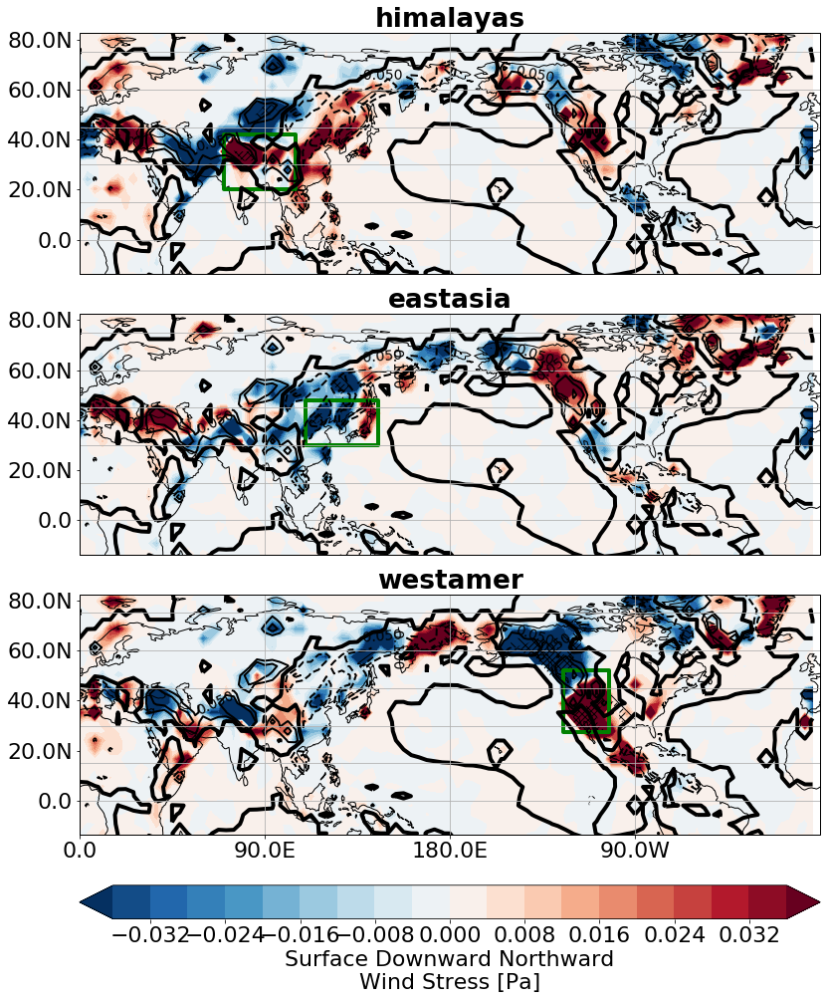

In [32]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    print(sel_dict)
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    CS = (ds_comp2).plot.contour(levels = [-0.1,-0.05,0.05,0.1], \
                                     colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# Zonal wind

In [8]:
var = 'ua'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)
ds_comp[var].attrs['units'] = 'm/s'
ds_comp[var].attrs['long_name'] = r'zonal wind'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/ua_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//ua/ua_climatology_woSSW.nc


<xarray.DataArray 'ua' (lat: 48, lon: 96)>
array([[-0.718928, -0.764878, -0.804849, ..., -0.54814 , -0.610204, -0.667261],
       [-0.633986, -0.675714, -0.707424, ..., -0.452569, -0.521737, -0.582485],
       [-0.478798, -0.520819, -0.547751, ..., -0.269247, -0.351543, -0.422014],
       ...,
       [10.631069, 10.592621, 10.472488, ..., 10.24776 , 10.457366, 10.58592 ],
       [ 4.740911,  4.68527 ,  4.582558, ...,  4.635943,  4.71389 ,  4.749882],
       [-1.313766, -1.448286, -1.589252, ..., -0.941864, -1.061703, -1.185215]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

ua@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


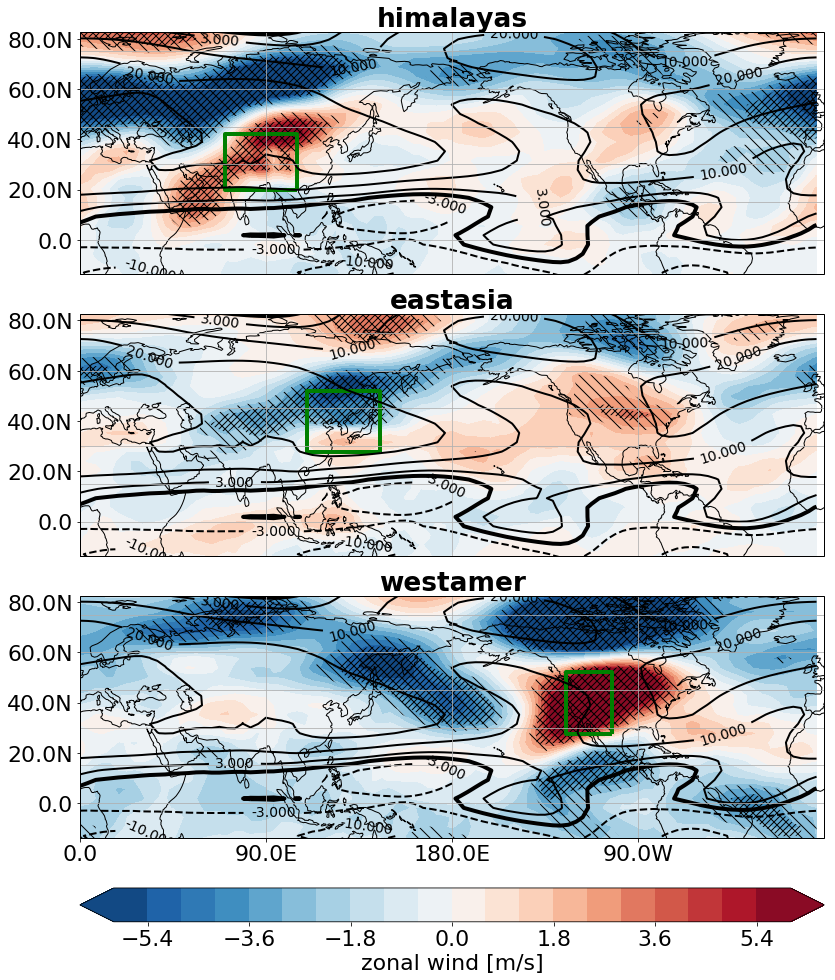

In [9]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    CS = (ds_comp2).plot.contour(levels = [-30,-20,-10,-3,3,10,20,30], \
                                     colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# Temperature

In [17]:
var = 'ta'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)
ds_comp[var].attrs['units'] = 'K'
ds_comp[var].attrs['long_name'] = r'temperature'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/ta_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//ta/ta_climatology_woSSW.nc


<xarray.DataArray 'ta' (lat: 48, lon: 96)>
array([[233.008041, 233.014876, 233.022195, ..., 232.990856, 232.995986,
        233.00173 ],
       [232.62679 , 232.644509, 232.662467, ..., 232.575348, 232.592001,
        232.609251],
       [232.087667, 232.106326, 232.123915, ..., 232.017787, 232.042901,
        232.066599],
       ...,
       [201.279742, 201.215108, 201.155323, ..., 201.50752 , 201.424776,
        201.349361],
       [201.250028, 201.196819, 201.149419, ..., 201.445147, 201.37403 ,
        201.309061],
       [201.809287, 201.779392, 201.752996, ..., 201.919321, 201.879317,
        201.842617]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

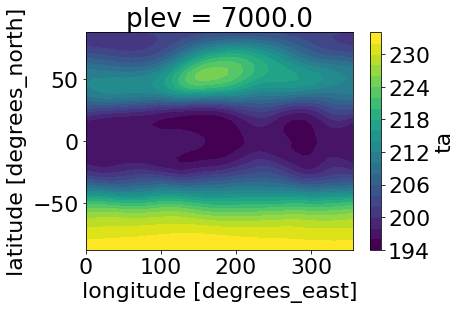

In [18]:
(ds_comp2).plot.contourf(robust = True, levels = 21)

/usr/local/lib/python3.6/dist-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"
/usr/local/lib/python3.6/dist-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"
/usr/local/lib/python3.6/dist-packages/matplotlib/contour.py:1243: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


ta@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


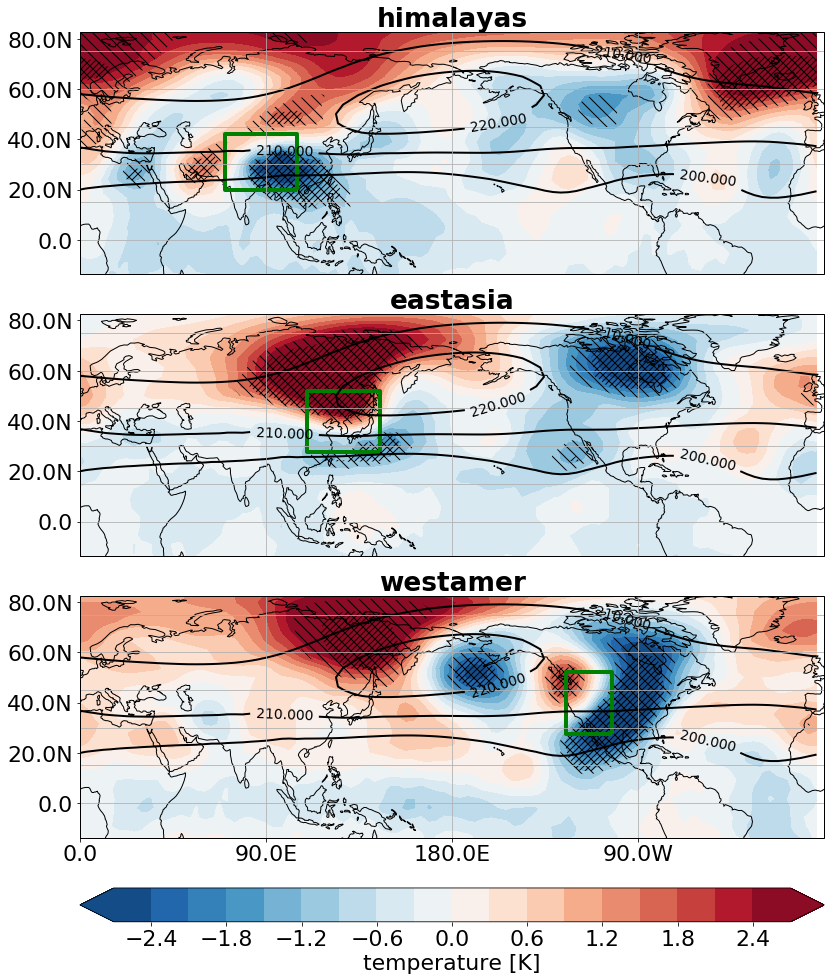

In [19]:
#fig = plt.figure(figsize=(15,9))
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    CS = (ds_comp2).plot.contour(levels = range(190,240,10), \
                                     colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
    plt.clabel(CS, inline=1, fontsize=14)
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# OGWD

In [17]:
var = 'accelogw'
ch_lev = 7000
what = 'absolute'
scale = 3600*24
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
#ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
#ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, combine='nested', concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*scale
ds_comp[var].attrs['units'] = r'm/s/day'
ds_comp[var].attrs['long_name'] = r'OGWD'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*scale
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/accelogw_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//accelogw/accelogw_climatology_woSSW.nc


<xarray.DataArray 'accelogw' (lat: 48, lon: 96)>
array([[ 1.27566129e-04,  1.70641983e-03, -1.94010744e-02, ...,
        -2.70996527e-03, -3.74694500e-03, -4.19056627e-03],
       [-1.95671484e-03, -2.81427072e-02, -2.41635886e-02, ...,
        -1.36615042e-02, -2.98721307e-02, -5.87683020e-02],
       [-9.25233566e-03, -2.31135550e-02, -2.46926693e-02, ...,
        -2.93053920e-02, -6.71913113e-03, -5.59148125e-02],
       ...,
       [ 3.82361029e-05,  3.95597657e-04, -2.97574831e-02, ...,
        -3.81287287e-03, -1.78857747e-04,  1.32959757e-05],
       [ 1.86226394e-10,  1.88774128e-10,  1.99590372e-10, ...,
        -6.98628730e-03, -1.85505028e-04, -1.74460414e-05],
       [ 1.86735253e-10,  1.89487437e-10,  1.82728258e-10, ...,
         1.93226530e-10,  1.89837239e-10,  1.89837239e-10]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

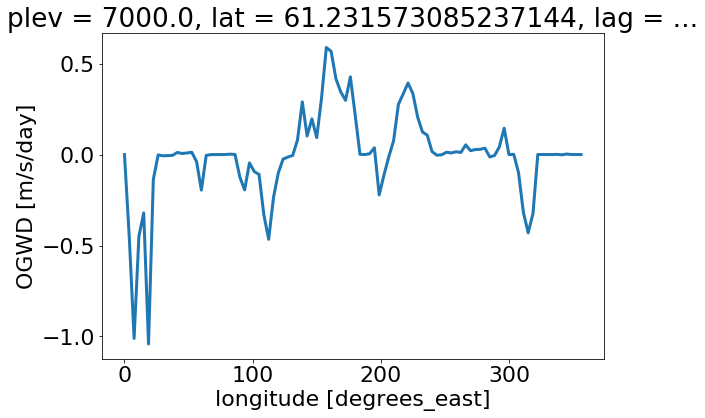

In [47]:
ds_comp[var].sel(e_type = 'westamer').sel(lat = 60, method='nearest').plot(size = 6, lw = 3)

accelogw@7000Pa_absolute_allwclim_20days_PlateCarree__DJFonly.pdf


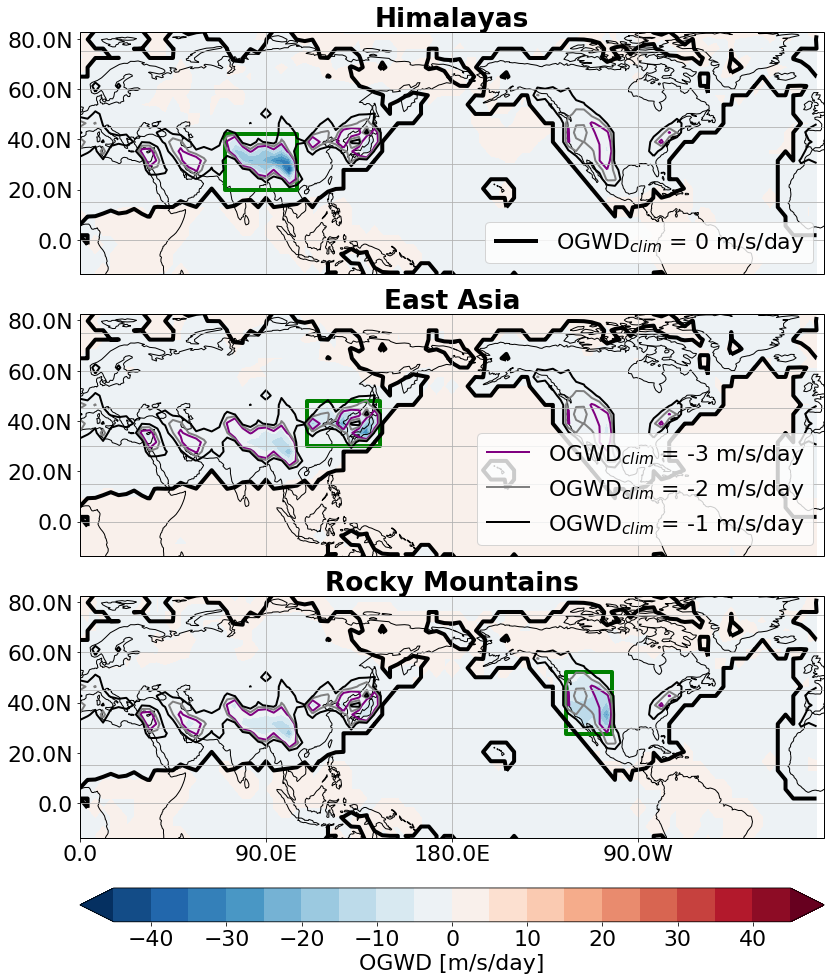

In [42]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
title_ls = ['Himalayas', 'East Asia', 'Rocky Mountains']
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', levels = 21, robust = False, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          extend = 'both', \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    CS = (ds_comp2).plot.contour(levels = [-3,-2,-1], \
                                    colors =['purple','gray','k'], \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
    if i == 1: 
        labels = [r"OGWD$_{clim}$ = -3 m/s/day", 
                  r"OGWD$_{clim}$ = -2 m/s/day", 
                  r"OGWD$_{clim}$ = -1 m/s/day"]
        for j in range(len(labels)):
            CS.collections[j].set_label(labels[j])

        ax.legend(loc='lower right')

    #plt.legend(proxy, )
        
    #plt.clabel(CS, inline=1, fontsize=14)
   
    CS = ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    if i == 0: 
        labels = [r"OGWD$_{clim}$ = 0 m/s/day"]
        for j in range(len(labels)):
            CS.collections[j].set_label(labels[j])

        ax.legend(loc='lower right')

    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    #temp = ds_pv[var].sel(**sel_dict)#*24*3600

    #temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    #temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(title_ls[i], fontdict = dict(fontweight = 'bold')) # sel_dict['e_type']
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = f'{var}@{ch_lev}{units}_{what}_allwclim_{time_scale}days_{proj_str}_{DJF_bool}.pdf'
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# OGWD rotation

In [12]:
var = 'ogwdrot'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e12
ds_comp[var].attrs['units'] = r'$10^{-12} s^{-2}$'
ds_comp[var].attrs['long_name'] = r'$\nabla\times \vec X_{OGWD}$'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*1e12
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/ogwdrot_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//ogwdrot/ogwdrot_climatology_woSSW.nc


<xarray.DataArray 'ogwdrot' (lat: 48, lon: 96)>
array([[-1.771543e+00,  2.980414e+00,  2.344678e+00, ..., -4.234175e-01,
         5.228306e-03,  2.781235e+00],
       [ 3.582760e-01,  1.334245e+00,  6.912725e-01, ...,  2.869459e-01,
        -4.075967e-01, -1.006848e+00],
       [ 2.084880e+00, -3.591441e-01, -4.796641e-01, ..., -1.784173e-01,
         8.067907e-02,  6.555012e-01],
       ...,
       [-2.703103e-01,  2.963368e-01, -5.092255e+00, ..., -4.302656e+00,
        -1.660205e-01,  1.305029e-01],
       [ 5.337283e-04,  5.522076e-03, -4.120146e-01, ..., -4.252075e+00,
        -9.196964e-02,  9.453318e-02],
       [-5.337274e-04, -5.522076e-03,  4.153796e-01, ..., -3.391075e-01,
        -7.920816e-03, -1.165325e-03]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

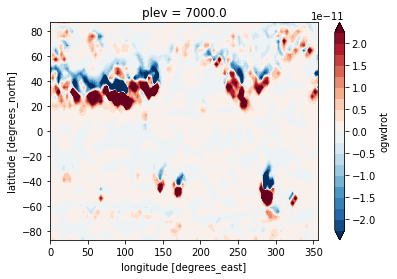

In [23]:
(ds_comp2).plot.contourf(robust = True, levels = 21)

ogwdrot@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


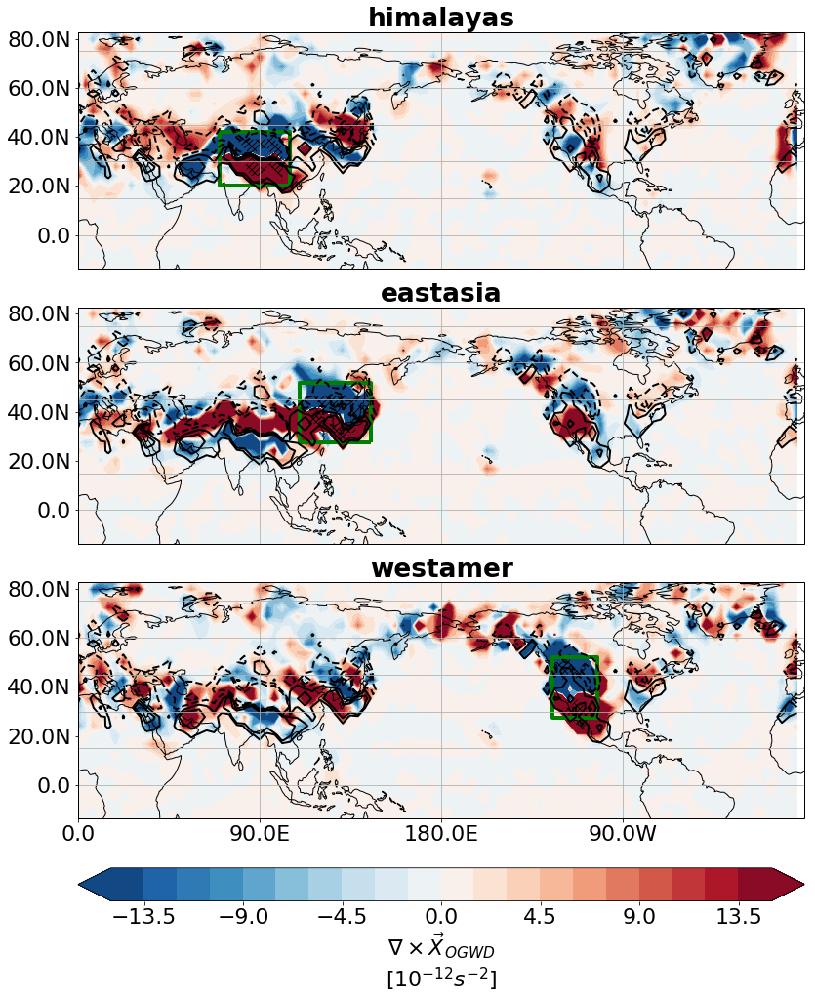

In [13]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    CS = (ds_comp2).plot.contour(levels = [-30,-10,10,30], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    #plt.clabel(CS, inline=1, fontsize=14)
    """
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    """
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

In [14]:
clevels = p.cbar.boundaries

# Meridional wind (ZM removed)

In [13]:
var = 'vaprime'
ch_lev = 25000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
#ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
#ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)#*1e12
ds_comp[var].attrs['units'] = r'm/s'
ds_comp[var].attrs['long_name'] = r'$v^{\prime}$'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]#*1e12
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/vaprime_pvalues_from10000_comp_*_20days@25000Pa.nc
/mnt/4data/CMAM/0A.daily//vaprime/vaprime_climatology_woSSW.nc


<xarray.DataArray 'vaprime' (lat: 48, lon: 96)>
array([[-0.314929, -0.279994, -0.2299  , ..., -0.324141, -0.337018, -0.334023],
       [-1.093587, -1.040829, -0.959781, ..., -1.002963, -1.080622, -1.109364],
       [-0.824044, -0.772305, -0.708304, ..., -0.605617, -0.765429, -0.832436],
       ...,
       [-0.467091, -0.96706 , -1.431459, ...,  1.146595,  0.600003,  0.058738],
       [-0.238041, -0.571799, -0.886087, ...,  0.822183,  0.465242,  0.10966 ],
       [-0.111015, -0.214331, -0.313123, ...,  0.193843,  0.096417, -0.006332]],
      dtype=float32)
Coordinates:
    plev     float64 2.5e+04
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

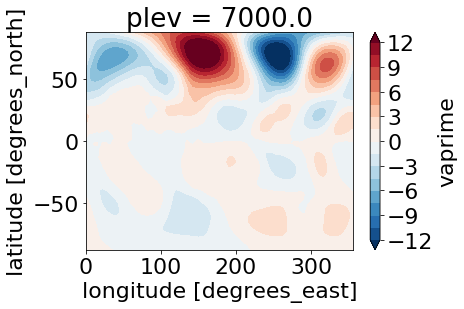

In [62]:
(ds_comp2).plot.contourf(robust = True, levels = 21)

vaprime@25000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


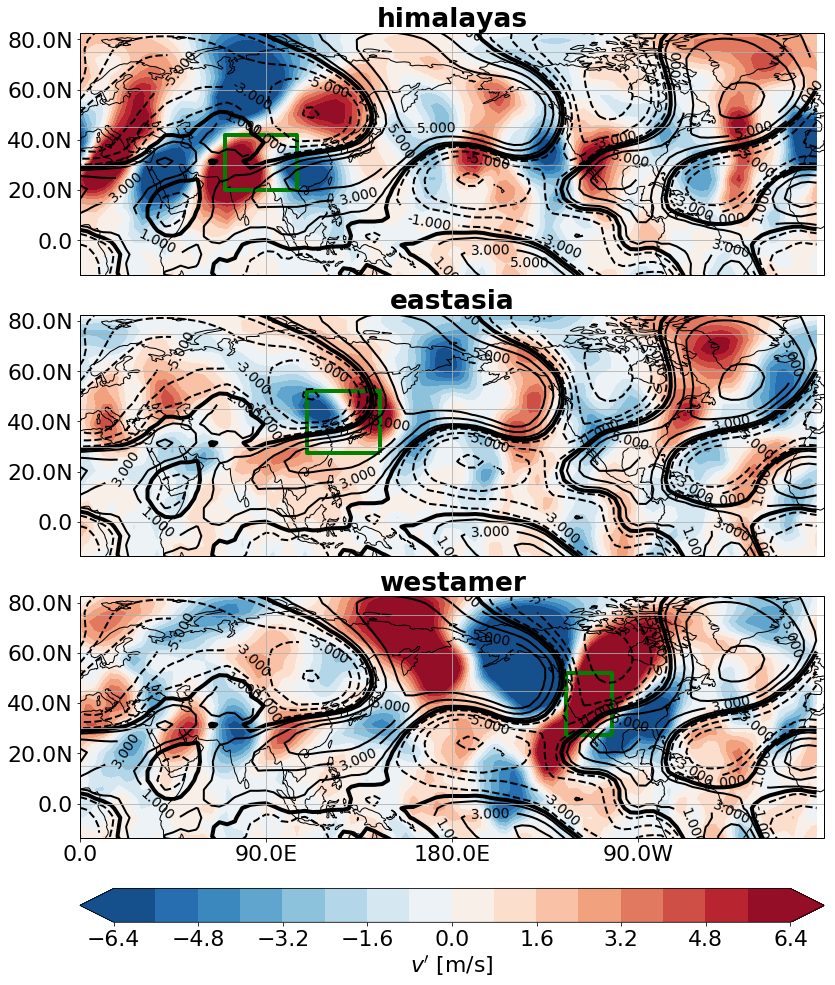

In [14]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', levels = 21, robust = True, \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    CS = (ds_comp2).plot.contour(levels = [-10,-5,-3,-1,1,3,5,10], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    #temp = ds_pv[var].sel(**sel_dict)#*24*3600

    #temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    #temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# -d OGWD_x / dy

In [15]:
var = 'daccelogwdy'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e12
ds_comp[var].attrs['units'] = r'$10^{-12} s^{-2}$'
ds_comp[var].attrs['long_name'] = r'-d$\,$OGWD$_{x}$/d$y$'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*1e12
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/daccelogwdy_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//daccelogwdy/daccelogwdy_climatology_woSSW.nc


<xarray.DataArray 'daccelogwdy' (lat: 48, lon: 96)>
array([[-1.388493e-02,  1.329787e+00,  1.935853e-01, ...,  2.437674e-01,
         1.425630e+00,  2.342926e+00],
       [ 1.312684e-01,  3.512696e-01,  7.463220e-02, ...,  3.730064e-01,
         4.569974e-02,  7.308080e-01],
       [ 9.254447e-02, -2.511235e-01, -2.628302e-01, ..., -5.645056e-02,
        -2.629842e-01, -6.403387e-01],
       ...,
       [ 1.174498e-06,  8.300227e-04,  2.533017e-03, ...,  9.815413e-02,
         2.589855e-03,  2.447724e-04],
       [ 5.337285e-04,  5.522077e-03, -4.153796e-01, ..., -5.434946e-02,
        -2.526551e-03,  1.827812e-04],
       [-5.337286e-04, -5.522077e-03,  4.153796e-01, ..., -3.391075e-01,
        -7.920817e-03, -1.165326e-03]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

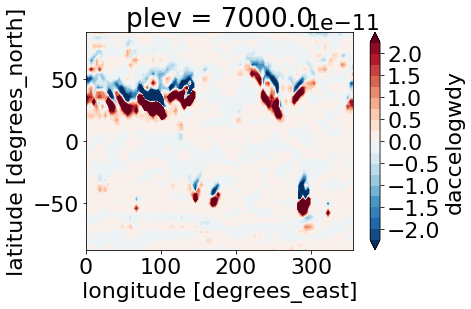

In [68]:
(ds_comp2).plot.contourf(robust = True, levels = 21)

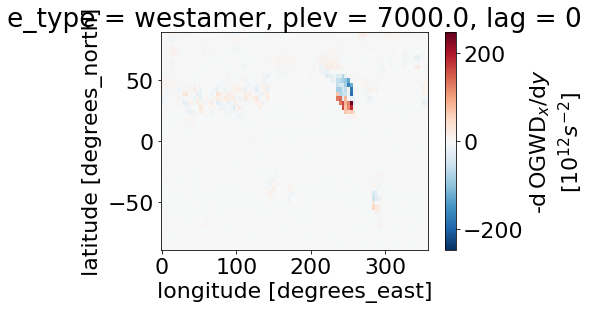

In [91]:
ds_comp[var][2].plot()

In [100]:
clevels

array([-1.00e+250, -1.50e+001, -1.35e+001, -1.20e+001, -1.05e+001,
       -9.00e+000, -7.50e+000, -6.00e+000, -4.50e+000, -3.00e+000,
       -1.50e+000,  0.00e+000,  1.50e+000,  3.00e+000,  4.50e+000,
        6.00e+000,  7.50e+000,  9.00e+000,  1.05e+001,  1.20e+001,
        1.35e+001,  1.50e+001,  1.00e+250])

daccelogwdy@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


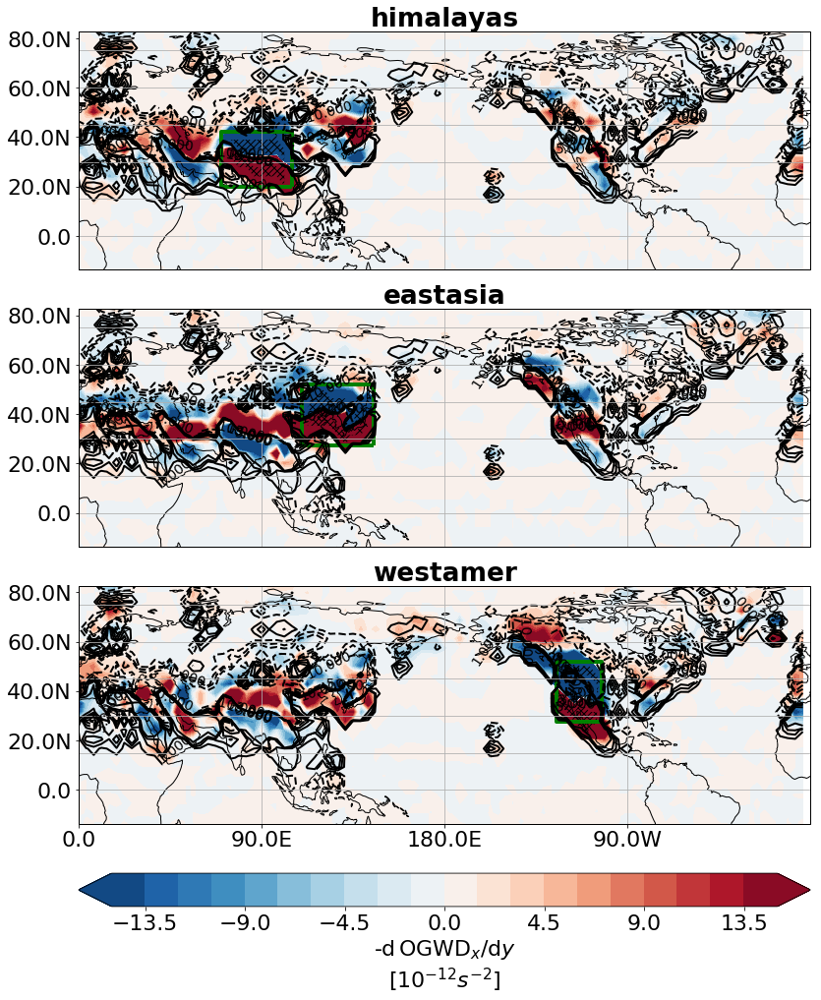

In [16]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', \
                                                            levels = clevels[1:-1], \
                                                            robust = True, \
                                                            extend = 'both', \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    CS = (ds_comp2).plot.contour(levels = [-10,-5,-3,-1,1,3,5,10], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    """
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    """
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# Eddy streamfunction

In [15]:
var = 'psiprime'
ch_lev = 25000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
#ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
#ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)/1e6
ds_comp[var].attrs['units'] = r'$10^{6} s^{-1}$'
ds_comp[var].attrs['long_name'] = r"$\psi^{'}$"

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]/1e6
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/psiprime_pvalues_from10000_comp_*_20days@25000Pa.nc
/mnt/4data/CMAM/0A.daily//psiprime/psiprime_climatology_woSSW.nc


<xarray.DataArray 'psiprime' (lat: 48, lon: 96)>
array([[-0.23158 , -0.225275, -0.221403, ..., -0.265069, -0.251551, -0.240352],
       [ 0.300229,  0.302169,  0.288001, ...,  0.192326,  0.245559,  0.281492],
       [ 1.692361,  1.670172,  1.61124 , ...,  1.522911,  1.619418,  1.675805],
       ...,
       [-0.68823 , -0.792415, -0.895332, ..., -0.401789, -0.489363, -0.586048],
       [-0.712628, -0.783641, -0.852338, ..., -0.501427, -0.569883, -0.640836],
       [-0.334399, -0.350144, -0.364882, ..., -0.284483, -0.301237, -0.317985]],
      dtype=float32)
Coordinates:
  * lat      (lat) float64 87.16 83.48 79.78 76.07 ... -79.78 -83.48 -87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2
    plev     float64 2.5e+04

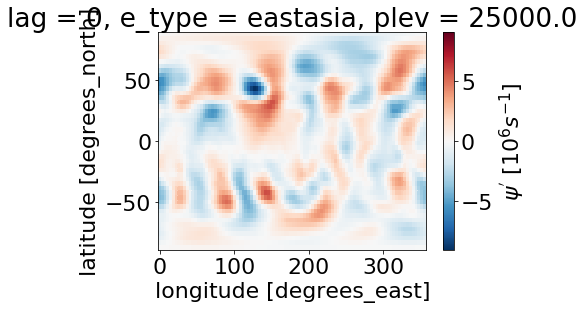

In [16]:
ds_comp[var][0].plot()

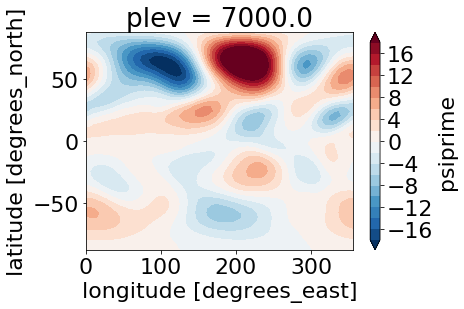

In [50]:
(ds_comp2).plot.contourf(robust = True, levels = 21)

psiprime@25000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


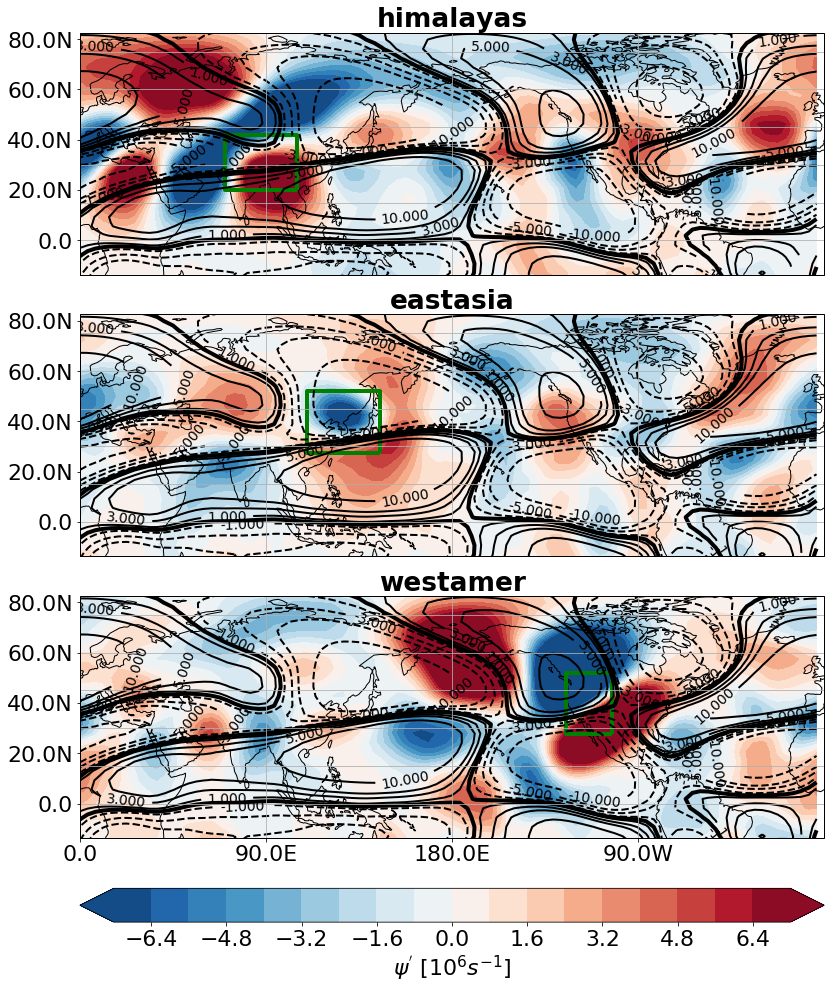

In [18]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', \
                                                            levels = 21, \
                                                            robust = True, \
                                                            extend = 'both', \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    CS = (ds_comp2).plot.contour(levels = [-10,-5,-3,-1,1,3,5,10], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    #temp = ds_pv[var].sel(**sel_dict)#*24*3600

    #temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    #temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

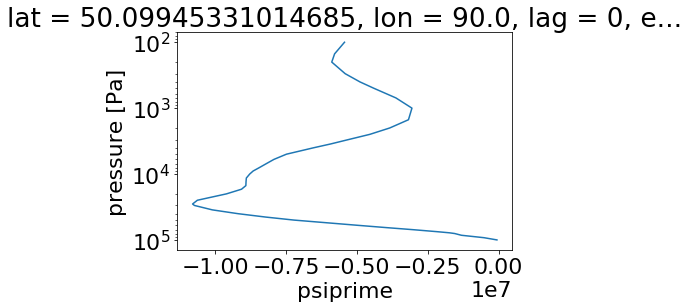

In [30]:
comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp[var].sel(e_type = 'himalayas', \
                 lag = 0, \
                 plev = slice(None, 100)).sel(lat = 50, \
                              lon = 90, \
                              method = 'nearest').plot(y = 'plev', \
                                                       yincrease = False)
plt.yscale('log')

# Divergence of OGWD

In [17]:
var = 'ogwddiv'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e12
ds_comp[var].attrs['units'] = r'$10^{-12} s^{-2}$'
ds_comp[var].attrs['long_name'] = r'$\nabla \cdot \vec X_{OGWD}$'#'\cdot$OGWD'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*1e12
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/ogwddiv_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//ogwddiv/ogwddiv_climatology_woSSW.nc


<xarray.DataArray 'ogwddiv' (lat: 48, lon: 96)>
array([[ 7.129209e+00, -5.462283e+00, -4.169702e+00, ..., -2.363429e+00,
        -5.581004e-01, -5.163192e-01],
       [-1.006898e+01, -2.641566e+00,  1.036747e+00, ..., -3.418712e+00,
        -5.558405e+00, -8.560474e+00],
       [-3.051389e+00, -1.197518e+00,  1.250820e+00, ...,  7.743796e-02,
        -1.883051e+00, -1.286013e+01],
       ...,
       [ 2.431499e+00, -2.320782e+00, -3.551767e+01, ...,  9.269073e+00,
         2.980602e-01, -2.377192e-01],
       [-1.037925e-04, -1.232907e-03, -5.419282e-02, ...,  8.379657e+00,
         8.457025e-01, -7.667707e-01],
       [ 1.037958e-04,  1.232907e-03,  5.307586e-02, ..., -1.197873e-02,
         1.359474e-03, -9.254471e-04]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

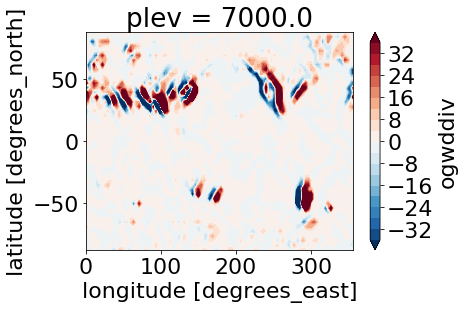

In [10]:
(ds_comp2).plot.contourf(robust = True, levels = 21)

ogwddiv@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


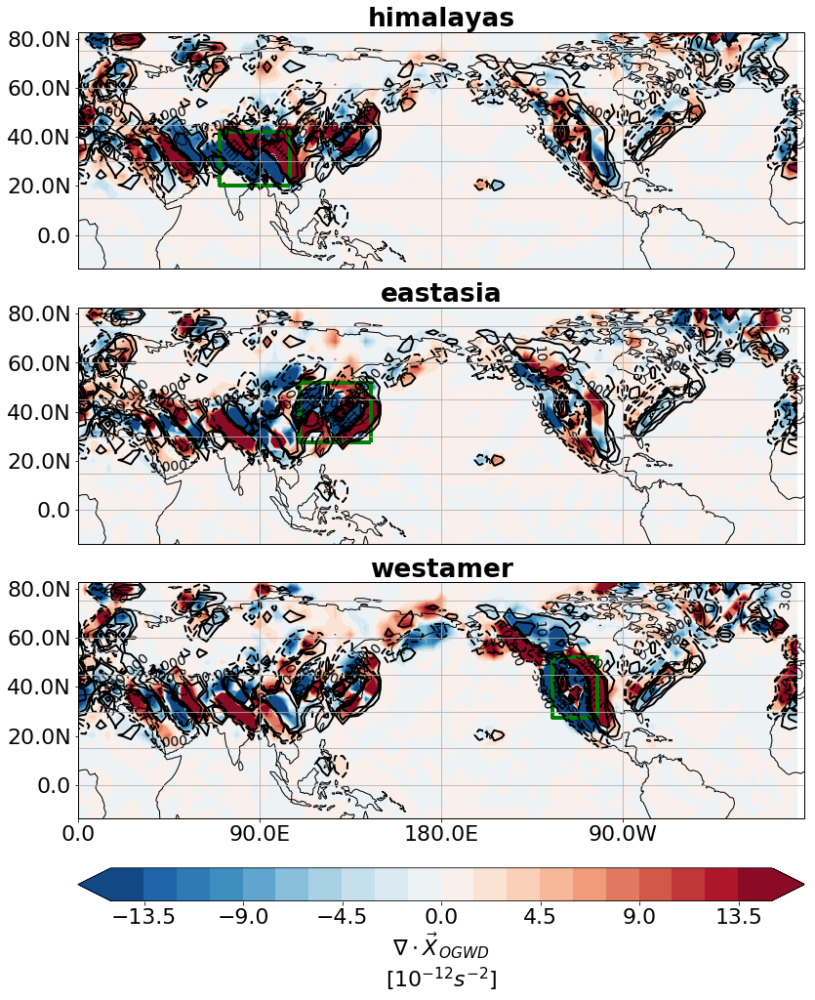

In [18]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
#clevels[1:-1]
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', \
                                                            levels = 21, \
                                                            robust = True, \
                                                            extend = 'both', \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    CS = (ds_comp2).plot.contour(levels = [-30,-10,-3,3,10,30], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    """
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    """
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# Vertical derivation of potential temperature

In [19]:
var = 'dtpotdp'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e3
ds_comp[var].attrs['units'] = r'$10^{-3}$ K/Pa'
ds_comp[var].attrs['long_name'] = r'$\partial \theta / \partial p$'#'\cdot$OGWD'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*1e3
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/dtpotdp_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//dtpotdp/dtpotdp_climatology_woSSW.nc


<xarray.DataArray 'dtpotdp' (lat: 48, lon: 96)>
array([[-22.443523, -22.445372, -22.447771, ..., -22.440598, -22.441284,
        -22.442213],
       [-22.506191, -22.517345, -22.52813 , ..., -22.486538, -22.488213,
        -22.495262],
       [-22.58303 , -22.595604, -22.605816, ..., -22.541998, -22.54905 ,
        -22.56737 ],
       ...,
       [-15.137092, -15.118477, -15.103736, ..., -15.211169, -15.184204,
        -15.159212],
       [-15.274818, -15.262491, -15.252439, ..., -15.322511, -15.305104,
        -15.289124],
       [-15.512511, -15.507199, -15.503054, ..., -15.535049, -15.526478,
        -15.518953]], dtype=float32)
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

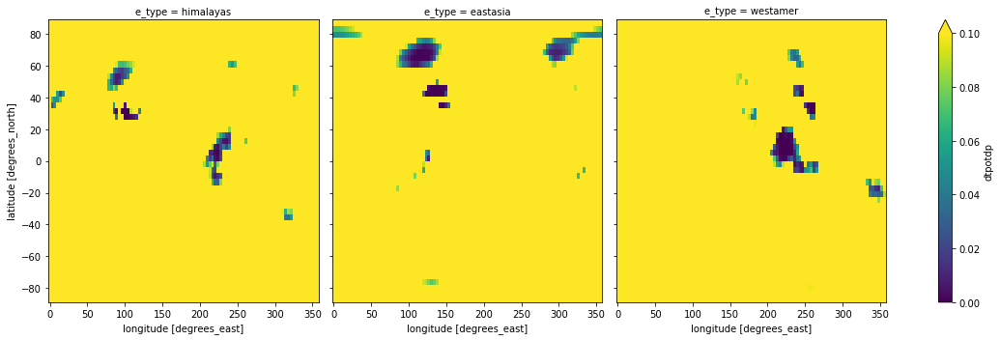

In [5]:
ds_pv[var].plot(col = 'e_type', size = 5, vmax = 0.1)

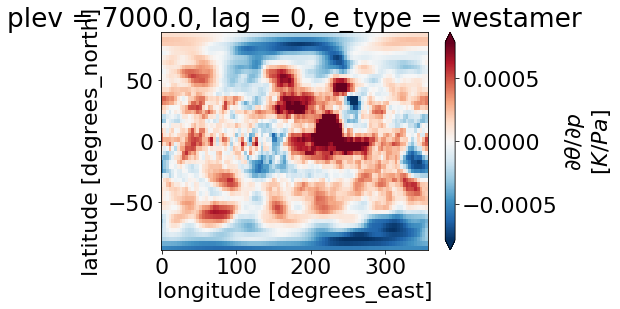

In [7]:
ds_comp[var][0].plot(robust = True)

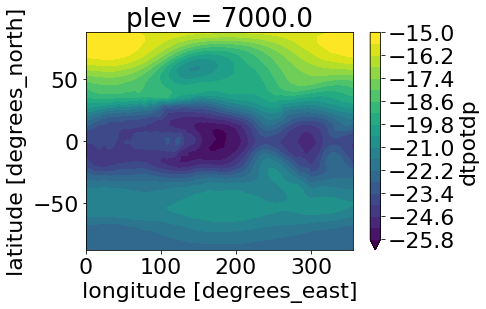

In [9]:
(ds_comp2).plot.contourf(robust = True, levels = 21)

dtpotdp@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


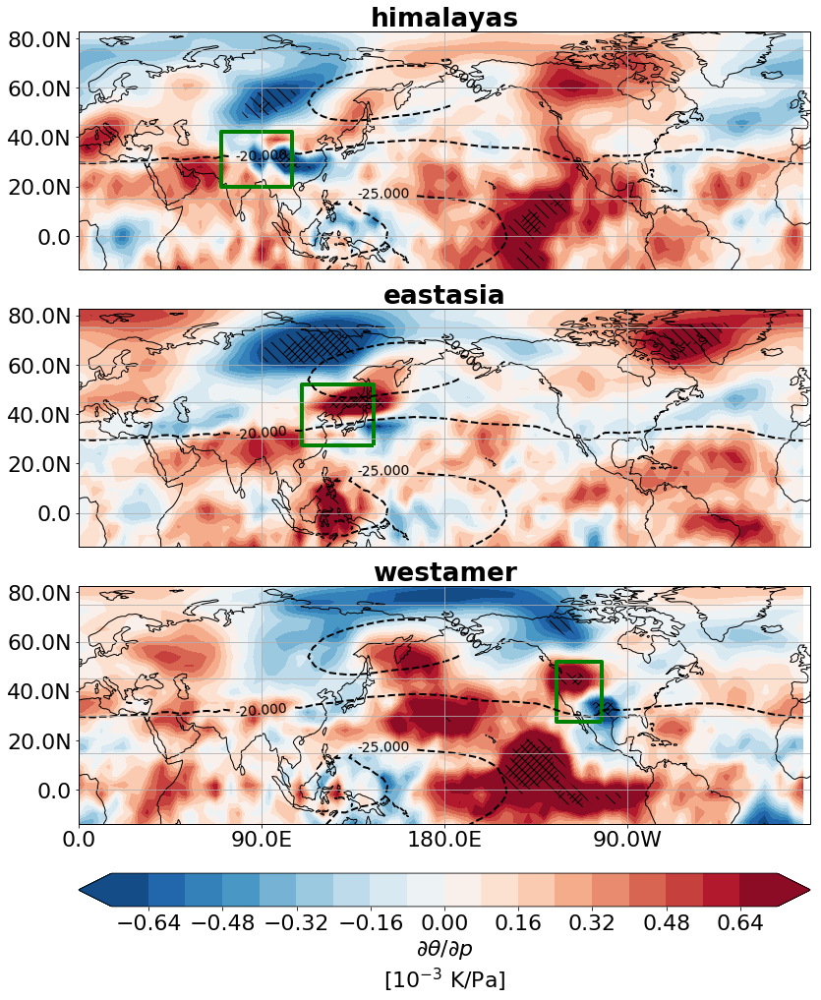

In [20]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
#clevels[1:-1]
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', \
                                                            levels = 21, \
                                                            robust = True, \
                                                            extend = 'both', \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    
    CS = (ds_comp2).plot.contour(levels = [-30,-25,-20,-15,-10,-5], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    """
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    """
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# tendency of relative vorticity

In [21]:
var = 'dvorreldt'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e12
ds_comp[var].attrs['units'] = r'$10^{-12} s^{-2}$'
ds_comp[var].attrs['long_name'] = r'$\partial \xi / \partial t$'#'\cdot$OGWD'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*1e12
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/dvorreldt_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//dvorreldt/dvorreldt_climatology_woSSW.nc


<xarray.DataArray 'dvorreldt' (lat: 48, lon: 96)>
array([[-0.204708, -0.218678, -0.230086, ..., -0.145739, -0.168329, -0.187969],
       [-0.190241, -0.109551, -0.021533, ..., -0.342982, -0.310386, -0.258555],
       [ 0.316255,  0.515671,  0.717822, ..., -0.134115, -0.01952 ,  0.13369 ],
       ...,
       [ 0.84322 ,  0.954256,  1.078614, ...,  0.684769,  0.704457,  0.757765],
       [ 0.351744,  0.342147,  0.32934 , ...,  0.412669,  0.381895,  0.363241],
       [ 0.13079 ,  0.087881,  0.048134, ...,  0.277713,  0.225816,  0.176798]],
      dtype=float32)
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

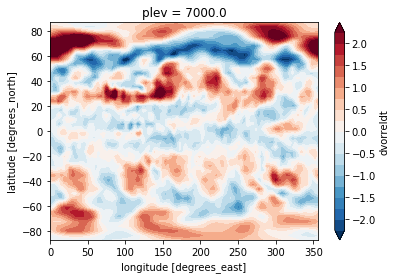

In [5]:
(ds_comp2).plot.contourf(robust = True, levels = 21)

In [19]:
ds_pv[var].min().compute()

<xarray.DataArray 'dvorreldt' ()>
array(14888013.958607)
Coordinates:
    plev     float64 7e+03
    lag      int64 0

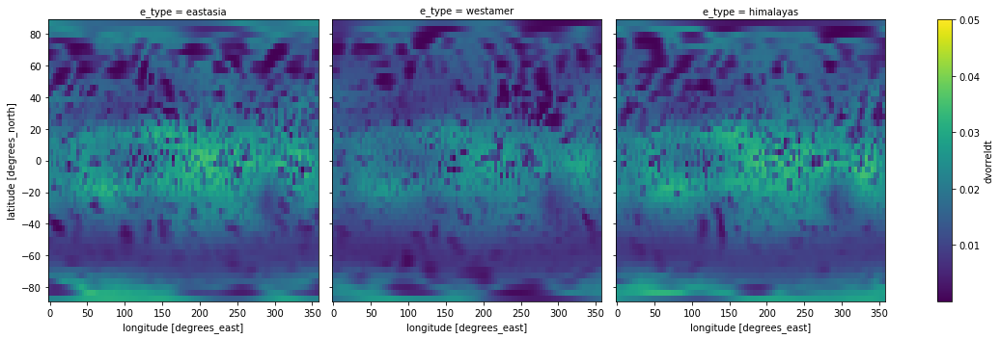

In [7]:
ds_pv[var].plot(col = 'e_type', size = 5, vmax = 0.05)

dvorreldt@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


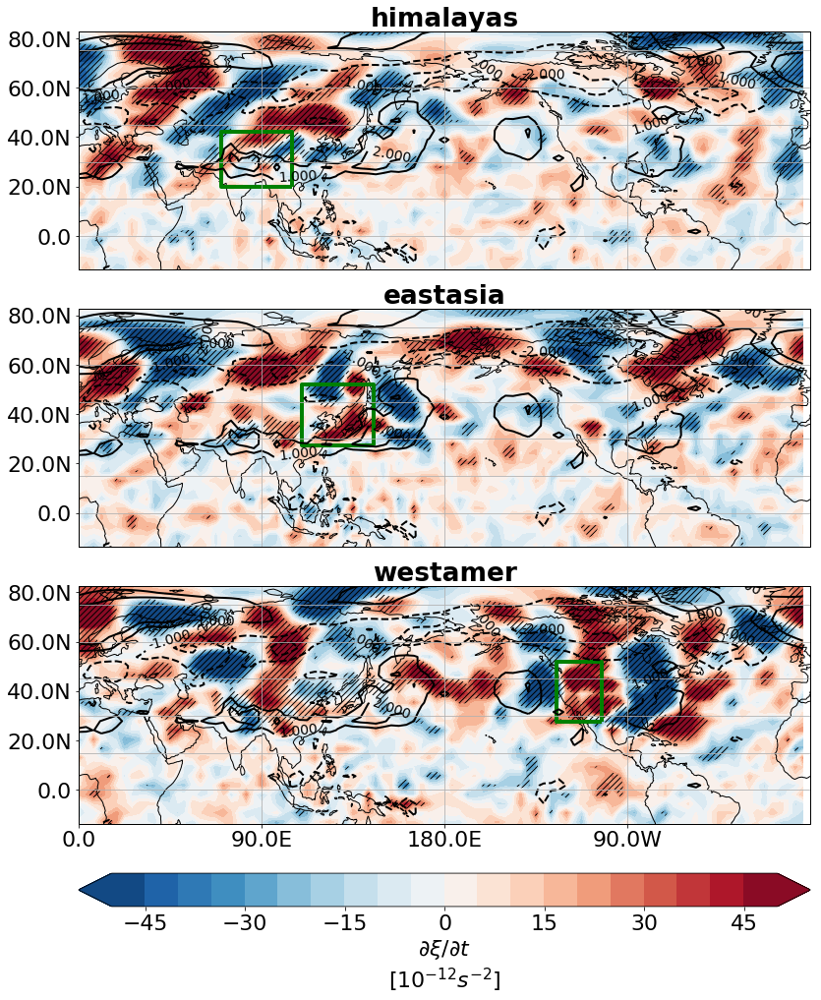

In [22]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
#clevels[1:-1]
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', \
                                                            levels = 21, \
                                                            robust = True, \
                                                            extend = 'both', \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    
    CS = (ds_comp2).plot.contour(levels = [-2,-1,1,2], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    """
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    """
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    #temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# tendency of pot. vorticity

In [16]:
var = 'dvorpotdt'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e12
ds_comp[var].attrs['units'] = r'$10^{-6} PVU/s$' #10^{-12}
ds_comp[var].attrs['long_name'] = r'$\partial PV / \partial t$'#'\cdot$OGWD'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*1e12
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/dvorpotdt_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//dvorpotdt/dvorpotdt_climatology_woSSW.nc


<xarray.DataArray 'dvorpotdt' (lat: 48, lon: 96)>
array([[1.086409, 1.082858, 1.07963 , ..., 1.099671, 1.094761, 1.090356],
       [1.107707, 1.130566, 1.154498, ..., 1.056419, 1.069796, 1.087122],
       [1.244198, 1.298189, 1.351478, ..., 1.109657, 1.146896, 1.192687],
       ...,
       [0.69226 , 0.715849, 0.742098, ..., 0.672651, 0.668415, 0.675431],
       [0.737025, 0.730575, 0.723188, ..., 0.761639, 0.75146 , 0.743612],
       [0.79439 , 0.786214, 0.778732, ..., 0.823583, 0.813028, 0.80331 ]],
      dtype=float32)
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

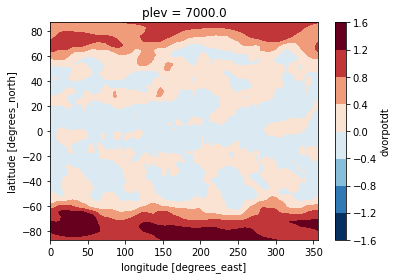

In [6]:
ds_comp2.plot.contourf(levels = 11)

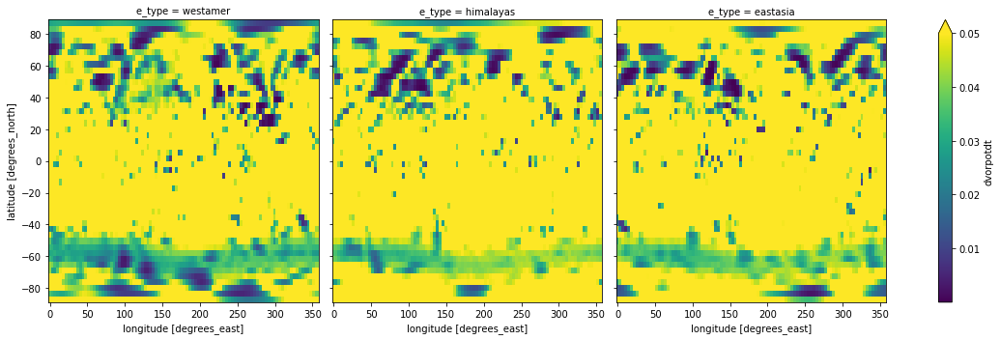

In [8]:
ds_pv.dvorpotdt.plot(col = 'e_type', size = 5, vmax = 0.05)

dvorpotdt@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


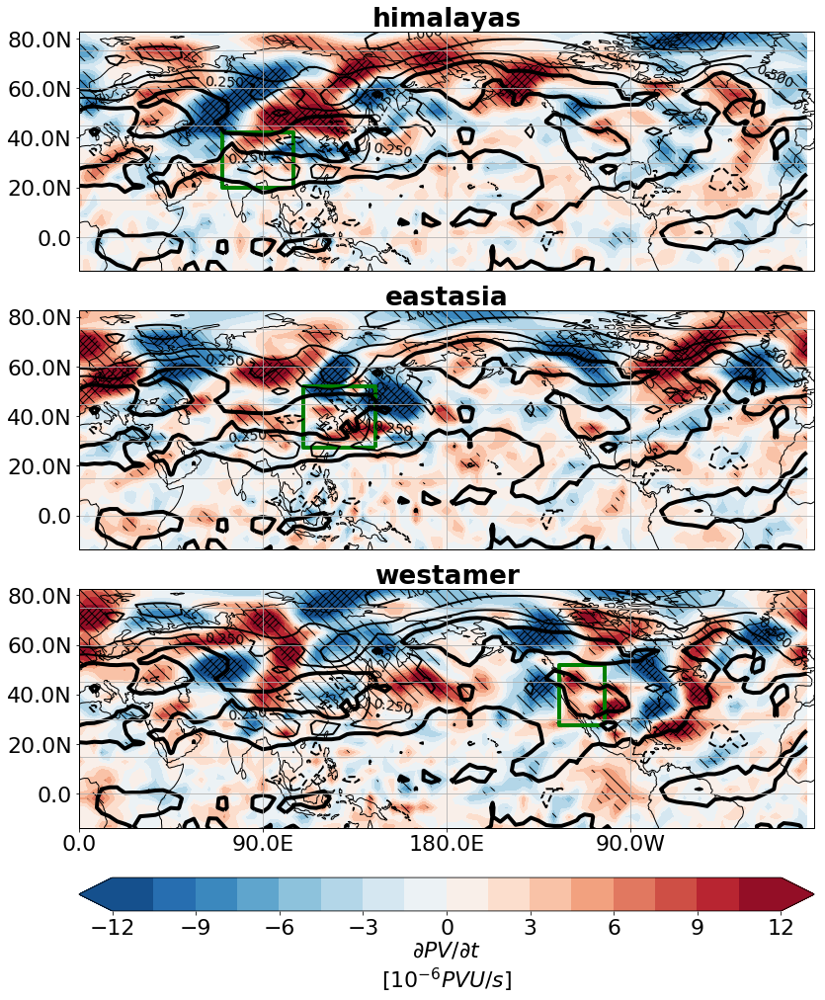

In [17]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
#clevels[1:-1]
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', \
                                                            levels = 21, \
                                                            robust = True, \
                                                            extend = 'both', \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    
    CS = (ds_comp2).plot.contour(levels = [-1, -0.5, -0.25, 0.25, 0.5, 1, ], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# tendency of vertical derivation of potential temperature

In [10]:
var = 'ddtpotdpdt'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e10
ds_comp[var].attrs['units'] = r'$10^{-10} K/s$' #
ds_comp[var].attrs['long_name'] = r'$\partial \theta_p / \partial t$'#'\cdot$OGWD'

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*1e10
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/ddtpotdpdt_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//ddtpotdpdt/ddtpotdpdt_climatology_woSSW.nc


<xarray.DataArray 'ddtpotdpdt' (lat: 48, lon: 96)>
array([[ 7.549463,  7.543346,  7.534143, ...,  7.555898,  7.555505,  7.553333],
       [ 7.795798,  7.815329,  7.825398, ...,  7.686214,  7.729342,  7.765917],
       [ 8.000764,  8.057703,  8.095112, ...,  7.710748,  7.821349,  7.922076],
       ...,
       [-4.030159, -4.054102, -4.081807, ..., -4.048984, -4.022895, -4.017632],
       [-4.692566, -4.654671, -4.611152, ..., -4.781122, -4.754704, -4.725563],
       [-4.980829, -4.965214, -4.950023, ..., -5.030629, -5.013461, -4.996893]],
      dtype=float32)
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

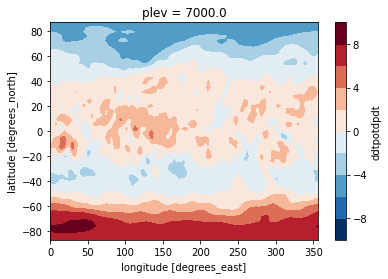

In [9]:
ds_comp2.plot.contourf(levels = 11)

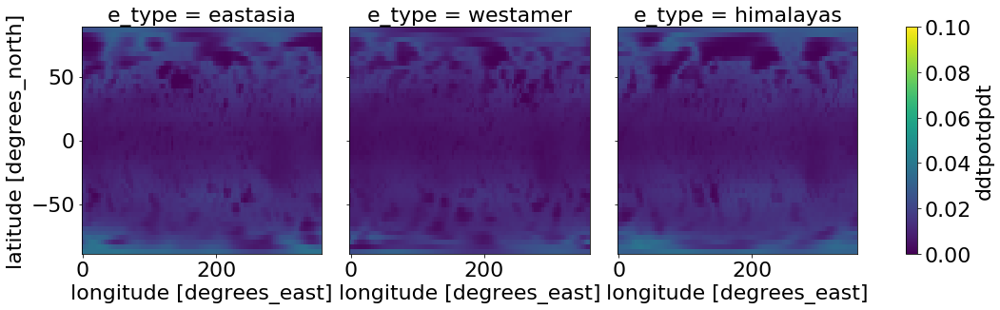

In [15]:
ds_pv[var].plot(col = 'e_type', robust = True, size = 5, vmax = 0.1, vmin = 0)

ddtpotdpdt@7000Pa_anomalies_allwclim_20days_wsignificancefrom10000_PlateCarree_DJFonly.pdf


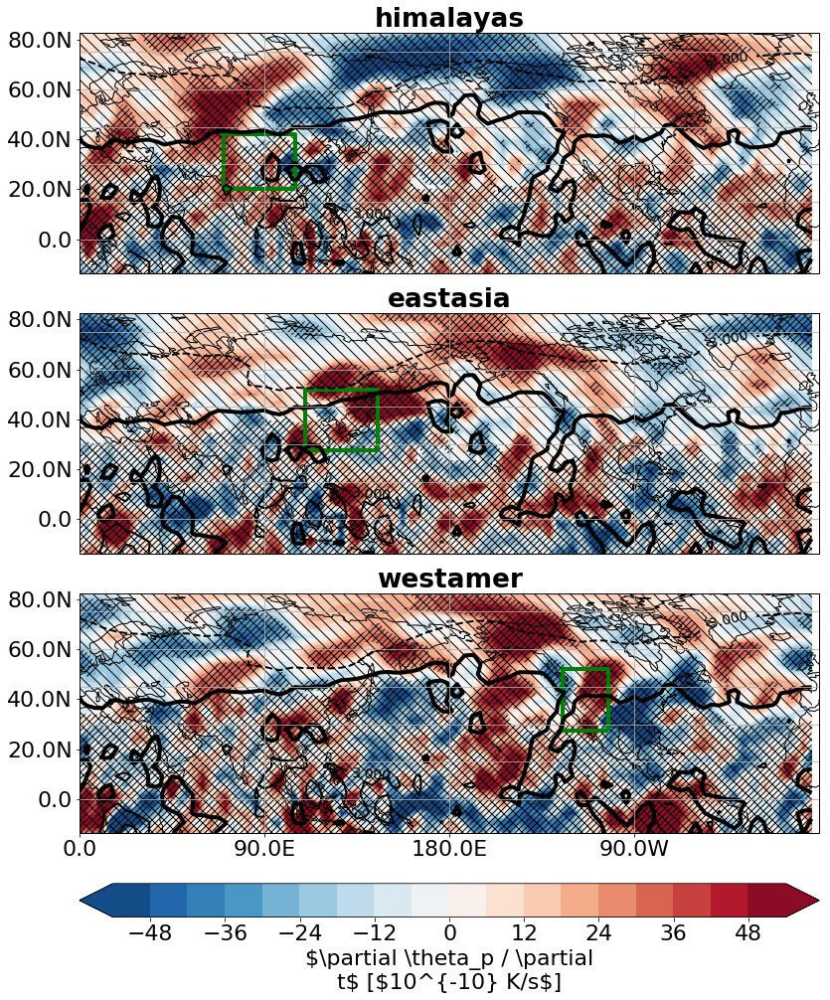

In [13]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
#clevels[1:-1]
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', \
                                                            levels = 21, \
                                                            robust = True, \
                                                            extend = 'both', \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    
    CS = (ds_comp2).plot.contour(levels = [-6,-3, 3, 6], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    temp = ds_pv[var].sel(**sel_dict)#*24*3600

    temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')

# CEQ

In [63]:
var = 'ceq'
ch_lev = 7000
what = 'anomalies'
if var.lower() in ['lwa']:
    lev_sys_fo = 'logH/'
    lev_sys_fi = '_logH'
    sel_dict = dict(z = ch_lev)
    units = 'm'

else:                                                           
    lev_sys_fo = ''
    lev_sys_fi = ''
    sel_dict = dict(plev = ch_lev)
    units = 'Pa'

    
outfile_name = '{}{}{}_pvalues_from{}_comp_*_{}days@{}Pa.nc'.format(cesta, var, lev_sys_fi, its, time_scale, ch_lev)
print(outfile_name)
outfile_name_ls = glob.glob(outfile_name)
#ds_pv = xr.open_mfdataset(outfile_name_ls, concat_dim='e_type')
#ds_pv['e_type'] = list(map(func, outfile_name_ls))

comp_file = '{}{}{}_{}_comp_*_{}days.nc'.format(cesta, var, lev_sys_fi, what, time_scale)
comp_file_ls = glob.glob(comp_file)
ds_comp = xr.open_mfdataset(comp_file_ls, concat_dim='e_type')
ds_comp['e_type'] = list(map(func, comp_file_ls))
ds_comp = ds_comp.sel(**sel_dict).sel(lag = 0)*1e10
ds_comp[var].attrs['units'] = r'$10^{-10} s^{-2}$' #
ds_comp[var].attrs['long_name'] = r"U$ \xi^{'}_x + \beta v^{'}$"#^{\prime}/ \partial x

comp_file = f'{cesta_root}/{var}/{lev_sys_fo}{var}_climatology_woSSW.nc'
print(comp_file)
sel_dict['month'] = [12, 1, 2]
ds_comp2 = xr.open_dataset(comp_file).sel(**sel_dict).mean('month')[var]*1e10
ds_comp2

/mnt/4data/CMAM/0A.daily/composites_woSSW_DJFonly/ceq_pvalues_from10000_comp_*_20days@7000Pa.nc
/mnt/4data/CMAM/0A.daily//ceq/ceq_climatology_woSSW.nc


<xarray.DataArray 'ceq' (lat: 48, lon: 96)>
array([[-8.469819e-02, -6.986914e-02, -5.519960e-02, ..., -1.216201e-01,
        -1.101799e-01, -9.814879e-02],
       [-8.710616e-02, -7.945593e-02, -7.216199e-02, ..., -1.015044e-01,
        -9.768369e-02, -9.310784e-02],
       [-6.615002e-03, -1.471067e-02, -2.770678e-02, ...,  4.357587e-03,
         2.479979e-03, -1.607512e-04],
       ...,
       [-3.273579e-01, -2.406534e-01, -1.411749e-01, ..., -3.303010e-01,
        -3.569292e-01, -3.737665e-01],
       [-1.522695e-01, -1.423954e-01, -1.315991e-01, ..., -1.812087e-01,
        -1.696867e-01, -1.611899e-01],
       [-1.961883e-01, -1.724994e-01, -1.472258e-01, ..., -2.645027e-01,
        -2.424626e-01, -2.195156e-01]])
Coordinates:
    plev     float64 7e+03
  * lat      (lat) float64 -87.16 -83.48 -79.78 -76.07 ... 79.78 83.48 87.16
  * lon      (lon) float64 0.0 3.75 7.5 11.25 15.0 ... 345.0 348.8 352.5 356.2

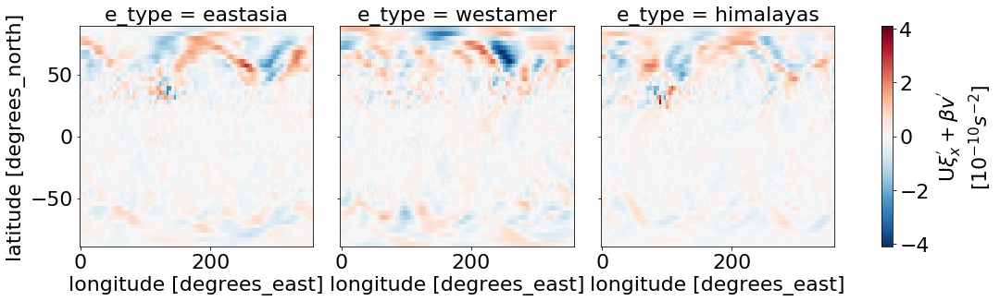

In [64]:
ds_comp.ceq.plot(col = 'e_type', size = 5)

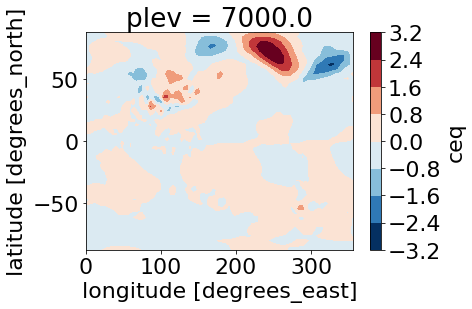

In [20]:
ds_comp2.plot.contourf(levels = 11)

In [ ]:
plt.rcParams.update({'font.size': 22})
projection = ccrs.PlateCarree(central_longitude=180)
#clevels[1:-1]
p = (ds_comp[var].sel(e_type = comp_name_ls)).plot.contourf(col = 'e_type', \
                                                            levels = 21, \
                                                            robust = True, \
                                                            extend = 'both', \
                                                          col_wrap = 1, \
                                                          transform=ccrs.PlateCarree(), \
                                                          aspect=ds_comp.dims['lon']/ds_comp.dims['lat'], \
                                                          size = 5, \
                                                          subplot_kws={'projection': projection}, \
                                                          cbar_kwargs = {'orientation': 'horizontal', \
                                                                         'pad': 0.05})

fmt = ticker.LogFormatterMathtext()
fmt.create_dummy_axis()

for i,(ax, sel_dict, box) in enumerate(zip(p.axes.flat, p.name_dicts.flat, boxes)):
    ax.coastlines()
    ax.gridlines(xlocs = [-180, -90, 0, 90, 180])
    ax.set_yticks([0, 20, 40, 60, 80], crs=ccrs.PlateCarree())
    lat_formatter = LatitudeFormatter(number_format='.1f', \
                                      degree_symbol='')        
    ax.yaxis.set_major_formatter(lat_formatter)

    if i == 2:
        ax.set_xticks([-90, 0, 90, 180], crs=ccrs.PlateCarree())
        lon_formatter = LongitudeFormatter(number_format='.1f', \
                                       degree_symbol='', \
                                       dateline_direction_label=True)    
        ax.xaxis.set_major_formatter(lon_formatter)
        
    
    
    
    CS = (ds_comp2).plot.contour(levels = [-3,-1, 1, 3], \
                                    colors = 'k', \
                                     ax = ax, linewidths = lw, \
                                     transform=ccrs.PlateCarree())
        
    plt.clabel(CS, inline=1, fontsize=14)
    
    ds_comp2.plot.contour(levels = [0], colors = 'k', \
                                                ax = ax, linewidths = lw*2, \
                                                transform=ccrs.PlateCarree())
    
    #, fmt = fmt)

    if proj_str == 'PlateCarree':
        ax.set_extent([0, 270, -10, 80])#ax.set_extent([-180, 180, -10, 80])
        ax.set_aspect('auto')

    plot_kwargs2 = dict(levels = [0,0.05], hatches=['\\\\',None], \
                                colors='none', add_colorbar=False, transform=ccrs.PlateCarree())
    #temp = ds_pv[var].sel(**sel_dict)#*24*3600

    #temp.plot.contourf(ax = ax, **plot_kwargs2)
    plot_kwargs2['levels'] = [0,0.01]
    plot_kwargs2['hatches'] = ['////',None]

    #temp.plot.contourf(ax = ax, **plot_kwargs2) #ax.contourf(temp.lon, temp.lat, temp.values, **plot_kwargs2)
    ax.set_title(sel_dict['e_type'], fontdict = dict(fontweight = 'bold'))
    ax.add_geometries([box], ccrs.PlateCarree(), \
                      facecolor=['none'], edgecolor=['green'], \
                      linewidth = [4])

    
    ax.set_xlabel('')
    ax.set_ylabel('')
    
    
out_fig = '{}@{}{}_{}_allwclim_{}days_wsignificancefrom{}_{}{}.pdf'.format(var, ch_lev, units, \
                                                                    what, time_scale, its, \
                                                                    proj_str, DJF_bool)
print(out_fig)
plt.savefig(out_fig, bbox_inches='tight')